In [1]:
from datasharing.datasharing import DataSharingClient
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.ops import unary_union
import re

In [2]:
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', None)

In [3]:
client = DataSharingClient(debug=True)

local_path = 'C:/Users/lazzz/PycharmProjects/datasharing/data_used/francetax.parquet'
view_name = "francetax"
client.create_view(local_path, view_name)

Authentication successful.
Getting identity ID...
Identity ID obtained: us-east-1:965f31bc-4398-ceed-80d7-4c23051bccb6
Getting OpenID token...
OpenID token obtained.
Getting credentials for identity...
Temporary credentials obtained.
DuckDB setup complete.
View francetax created.


# Look for inconsistant codes

In [201]:
query = """WITH distinct_communes AS (
    SELECT DISTINCT 
        REPLACE("Libellé commune", '-', ' ') AS name, 
        "code INSEE",  
        LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') AS DEPARTEMENT, 
        COMMUNE
    FROM francetax
)
SELECT 
    name, 
    "code INSEE",
    DEPARTEMENT,
    COMMUNE,
FROM distinct_communes
WHERE name IN (
    SELECT name 
    FROM distinct_communes 
    GROUP BY name 
    HAVING COUNT(DISTINCT COMMUNE) > 1
)
ORDER BY name, COMMUNE;"""
res = client.query(query)

Query: WITH distinct_communes AS (
    SELECT DISTINCT 
        REPLACE("Libellé commune", '-', ' ') AS name, 
        "code INSEE",  
        LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') AS DEPARTEMENT, 
        COMMUNE
    FROM francetax
)
SELECT 
    name, 
    "code INSEE",
    DEPARTEMENT,
    COMMUNE,
FROM distinct_communes
WHERE name IN (
    SELECT name 
    FROM distinct_communes 
    GROUP BY name 
    HAVING COUNT(DISTINCT COMMUNE) > 1
)
ORDER BY name, COMMUNE;


In [202]:
96 - 971
98 - 973
99 - 974
# 97 - 972

-875

In [203]:
res.sort_values(by=['DEPARTEMENT', 'name'], ascending=[False, True]).dropna().iloc[:1000,:]

,name,code INSEE,DEPARTEMENT,COMMUNE
508,AVIRONS,99401,99,401
1312,BRAS PANON,99402,99,402
2252,CILAOS,99424,99,424
2760,ENTRE DEUX,99403,99,403
2812,ETANG SALE,99404,99,404
3962,LA POSSESSION,99408,99,408
4439,LE PORT,99407,99,407
6248,PETITE ILE,99405,99,405
6303,PLAINE DES PALMISTES,99406,99,406
7050,SAINT ANDRE,99409,99,409


In [204]:
query = """SELECT DISTINCT 
    REPLACE("Libellé commune", '-', ' ') AS name, 
    "code INSEE",  
    LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') AS DEPARTEMENT, 
    COMMUNE
FROM francetax
WHERE LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') = '976'
"""
client.query(query)

Query: SELECT DISTINCT 
    REPLACE("Libellé commune", '-', ' ') AS name, 
    "code INSEE",  
    LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') AS DEPARTEMENT, 
    COMMUNE
FROM francetax
WHERE LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') = '976'



,name,code INSEE,DEPARTEMENT,COMMUNE
0,BANDRELE,None,976,3
1,CHICONI,None,976,5
2,CHIRONGUI,None,976,6
3,DEMBENI,None,976,7
4,PAMANDZI,None,976,15
5,ACOUA,97601,976,1
6,KANI KELI,None,976,9
7,DEMBENI,97607,976,7
8,KOUNGOU,97610,976,10
9,MTSANGAMOUJI,None,976,13


In [52]:
res[res['name'].isin(res[res['DEPARTEMENT'] == '97']['name'].unique())]

,name,code INSEE,DEPARTEMENT,COMMUNE
678,BASSE POINTE,97203,972,3
679,BASSE POINTE,None,972,3
680,BASSE POINTE,97203,97,203
887,BELLEFONTAINE,None,972,34
888,BELLEFONTAINE,97234,972,34
889,BELLEFONTAINE,50043,50,43
890,BELLEFONTAINE,None,50,43
891,BELLEFONTAINE,None,39,47
892,BELLEFONTAINE,39047,39,47
893,BELLEFONTAINE,88048,88,48


# Fix missing INSEE codes

In [4]:
query ="""SELECT DISTINCT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS name,
    "code INSEE",
    CASE 
        WHEN DEPARTEMENT IN ('96', '98', '99') THEN CONCAT('97', RIGHT(DEPARTEMENT, 1))
        ELSE LTRIM(DEPARTEMENT, '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN DEPARTEMENT IN ('96', '98', '99') AND LENGTH(COMMUNE) = 3 THEN RIGHT(COMMUNE, 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(COMMUNE, '''', '')
    END AS COMMUNE
FROM (
    SELECT 
        "Libellé commune",
        "code INSEE",
        LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') AS DEPARTEMENT,
        CAST(COMMUNE AS VARCHAR) AS COMMUNE
    FROM francetax
) AS cleaned_data;
"""
commune_code = client.query(query=query)

Query: SELECT DISTINCT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS name,
    "code INSEE",
    CASE 
        WHEN DEPARTEMENT IN ('96', '98', '99') THEN CONCAT('97', RIGHT(DEPARTEMENT, 1))
        ELSE LTRIM(DEPARTEMENT, '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN DEPARTEMENT IN ('96', '98', '99') AND LENGTH(COMMUNE) = 3 THEN RIGHT(COMMUNE, 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(COMMUNE, '''', '')
    END AS COMMUNE
FROM (
    SELECT 
        "Libellé commune",
        "code INSEE",
        LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') AS DEPARTEMENT,
        CAST(COMMUNE AS VARCHAR) AS COMMUNE
    FROM francetax
) AS cleaned_data;



In [5]:
def create_insee_code(department, commune):
    if len(department) <= 2:
      # Ensure department code is 2 digits
        return f"{department.zfill(2)}{commune.zfill(3)}"
    else:
        return f"{department}{commune.zfill(2)}"

In [6]:
commune_code = commune_code.astype('string')
commune_code['code INSEE'] = commune_code.apply(lambda row: create_insee_code(row['DEPARTEMENT'], row['COMMUNE']), axis=1)
commune_code.drop_duplicates('code INSEE', inplace=True)

# LOAD ALL DATA HERE 

# Completeness of the dataset

In [23]:
query="""SELECT column_name
FROM INFORMATION_SCHEMA.COLUMNS
WHERE table_name = 'francetax';
"""
column_names = client.query(query)

Query: SELECT column_name
FROM INFORMATION_SCHEMA.COLUMNS
WHERE table_name = 'francetax';



## Completness by column

In [9]:
# Initialize an empty DataFrame to store results
results_df = pd.DataFrame()

# Iterate over each column name to calculate completeness
for column_name in column_names['column_name']:
    query = f'''
    SELECT 
        CAST(COUNT(CASE 
            WHEN column_value IS NOT NULL 
            AND column_value != '.' 
            AND column_value != ','
            AND TRIM(CAST(column_value AS VARCHAR)) != ''
            THEN 1 
        END) AS FLOAT) / 1528922.0 AS completeness
    FROM (
        SELECT CAST("{column_name}" AS VARCHAR) AS column_value FROM francetax
    ) AS unpivoted
    '''
    try:
        # Execute the query and store the result
        result = client.query(query)
        result['column_name'] = column_name
        # Concatenate the result to the results DataFrame
        results_df = pd.concat([results_df, result], ignore_index=True)
    except Exception as e:
        # Print the error message and raise the exception to terminate the process
        print(f"Error processing column '{column_name}': {str(e)}")
        raise
# Sort the result DataFrame by completeness in descending order
results_df.sort_values('completeness', ascending=False, inplace=True)

Query: 
    SELECT 
        CAST(COUNT(CASE 
            WHEN column_value IS NOT NULL 
            AND column_value != '.' 
            AND column_value != ','
            AND TRIM(CAST(column_value AS VARCHAR)) != ''
            THEN 1 
        END) AS FLOAT) / 1528922.0 AS completeness
    FROM (
        SELECT CAST("DEPARTEMENT" AS VARCHAR) AS column_value FROM francetax
    ) AS unpivoted
    
Query: 
    SELECT 
        CAST(COUNT(CASE 
            WHEN column_value IS NOT NULL 
            AND column_value != '.' 
            AND column_value != ','
            AND TRIM(CAST(column_value AS VARCHAR)) != ''
            THEN 1 
        END) AS FLOAT) / 1528922.0 AS completeness
    FROM (
        SELECT CAST("DIRECTION" AS VARCHAR) AS column_value FROM francetax
    ) AS unpivoted
    
Query: 
    SELECT 
        CAST(COUNT(CASE 
            WHEN column_value IS NOT NULL 
            AND column_value != '.' 
            AND column_value != ','
            AND TRIM(CAST(column_valu

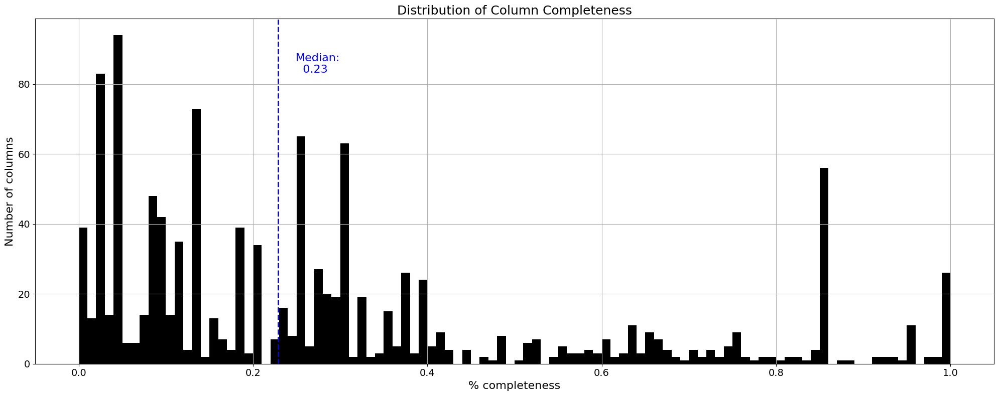

In [26]:
fig, ax = plt.subplots(1, figsize=(20, 8))

# Plot the histogram
results_df.hist(ax=ax, bins=100, color='black')

# Calculate the median
median = results_df['completeness'].median()

# Add a vertical line for the median
ax.axvline(x=median, color='blue', linestyle='--', linewidth=2)

# Add text annotation for the median
ax.text(median + 0.02, ax.get_ylim()[1] * 0.9, f'Median:\n  {median:.2f}', 
        rotation=0, verticalalignment='top', color='blue', fontsize=16)

# Set labels and title with increased font size
ax.set_xlabel('% completeness', fontsize=16)
ax.set_ylabel('Number of columns', fontsize=16)
ax.set_title('Distribution of Column Completeness', fontsize=18)

# Increase tick label font size
ax.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()

# # Create the plots directory if it doesn't exist
# os.makedirs('plots', exist_ok=True)

# # Save the plot
# plt.savefig('plots/column_compl_hist.png', dpi=100, bbox_inches='tight')

plt.show()

In [14]:
results_df[(results_df['completeness'] > 0.8564) & (results_df['completeness'] < 0.857)]

,completeness,column_name
72,0.856419,FB - SYNDICATS ET ORG. ASSIMILES / TAUX NET
190,0.856419,TH - INTERCOMMUNALITE / TAUX APPLICABLE SUR LE...
401,0.856419,CFE - CHAMBRES DES METIERS / DROIT ADDITIONNE...
331,0.856419,CFE - COMMUNE /TAUX NET
67,0.856419,FB - COMMUNE / TAUX NET
12,0.856419,FNB - COMMUNE / TAUX NET
184,0.856419,TH - SYNDICATS ET ORG. ASSIMILES / TAUX NET
81,0.856419,FB - TSE / TAUX NET
397,0.856419,CFE - CHAMBRE DES METIERS / DROIT FIXE / QUOTITE
364,0.856419,CFE - TSE / TAUX NET


## Completeness by year

In [27]:
years_res_df = pd.DataFrame(data=[i for i in range(1982,2023)], columns=['year'])
for column_name in column_names['column_name']:
    query = f"""
        SELECT
            year,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
                THEN 1 
            END) AS FLOAT) / CAST(COUNT(*) AS FLOAT) AS "{column_name}"
        FROM (
            SELECT CAST("{column_name}" AS VARCHAR) AS column_value, "ANNEE" AS year FROM francetax
        ) AS unpivoted
    GROUP BY year
    ORDER BY year
    """
    try:
        # Execute the query and store the result
        result = client.query(query)
        # Concatenate the result to the results DataFrame
        years_res_df = pd.merge(years_res_df, result, how='left', on='year')
    except Exception as e:
        # Print the error message and raise the exception to terminate the process
        print(f"Error processing column '{column_name}': {str(e)}")
        raise
# Set index to column year and transpose df to get data ob completness by year
years_res_df.set_index('year', inplace=True)
years_res_df = years_res_df.T

Query: 
        SELECT
            year,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
                THEN 1 
            END) AS FLOAT) / CAST(COUNT(*) AS FLOAT) AS "DEPARTEMENT"
        FROM (
            SELECT CAST("DEPARTEMENT" AS VARCHAR) AS column_value, "ANNEE" AS year FROM francetax
        ) AS unpivoted
    GROUP BY year
    ORDER BY year
    
Query: 
        SELECT
            year,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
                THEN 1 
            END) AS FLOAT) / CAST(COUNT(*) AS FLOAT) AS "DIRECTION"
        FROM (
            SELECT CAST("DIRECTION" AS VARCHAR) AS column_value, "ANNEE" AS year FROM francetax
      

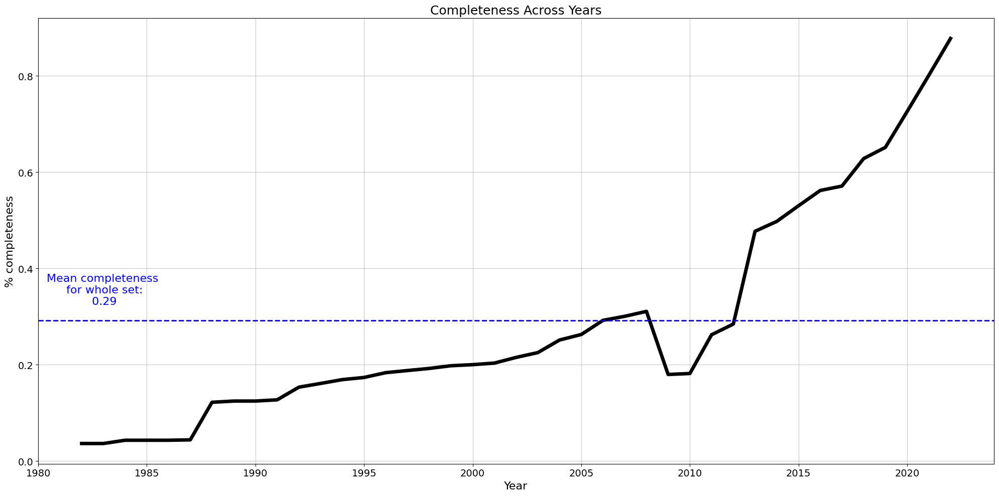

In [94]:

fig, ax = plt.subplots(1, figsize=(20, 10))

# Plot the line graph
years_res_df.mean().plot(ax=ax, color='black', linewidth=5)

# Calculate the average
average = results_df['completeness'].mean()

# Add a horizontal line for the average
ax.axhline(y=average, color='blue', linestyle='--', linewidth=2)

# Add text annotation for the average
ax.text(ax.get_xlim()[0]*1.0015, average*1.1, f'Mean completeness\n for whole set:\n {average:.2f}', 
        horizontalalignment='center', verticalalignment='bottom', 
        color='blue', fontsize=16)

# Set labels and title with increased font size
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('% completeness', fontsize=16)
ax.set_title('Completeness Across Years', fontsize=18)

# Increase tick label font size
ax.tick_params(axis='both', which='major', labelsize=14)

ax.grid(True, alpha=0.7)

plt.tight_layout()

# Save the plot
# plt.savefig('plots/years_completeness_plot.png', dpi=100, bbox_inches='tight')

plt.show()


## Completeness by commune

In [15]:
commune_res_df = commune_code[['DEPARTEMENT', 'COMMUNE']].copy()

In [171]:
query = """SELECT 
    LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') AS DEPARTEMENT, 
    COMMUNE
FROM 
    francetax
GROUP BY 
    LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0'), 
    COMMUNE
ORDER BY 
    DEPARTEMENT, 
    COMMUNE;
"""
commune_res_df = client.query(query)

Query: SELECT 
    LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') AS DEPARTEMENT, 
    COMMUNE
FROM 
    francetax
GROUP BY 
    LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0'), 
    COMMUNE
ORDER BY 
    DEPARTEMENT, 
    COMMUNE;



In [21]:
commune_res_df = commune_code[['DEPARTEMENT', 'COMMUNE']].copy()
commune_res_df['COMMUNE'] = commune_res_df['COMMUNE'].astype(str)
for column_name in column_names['column_name']:
    query = f"""
        SELECT
            DEPARTEMENT,
            COMMUNE,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
                THEN 1 
            END) AS FLOAT) / CAST(COUNT(*) AS FLOAT) AS "{column_name}"
        FROM (
            SELECT 
                CAST("{column_name}" AS VARCHAR) AS column_value, 
                LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') AS DEPARTEMENT,
                COMMUNE 
            FROM francetax
        ) AS unpivoted
    GROUP BY DEPARTEMENT, COMMUNE
    ORDER BY DEPARTEMENT, COMMUNE
    """
    try:
        # Execute the query and store the result
        result = client.query(query)
        result['COMMUNE'] = result['COMMUNE'].astype(str)
        # Merge the result with the main DataFrame
        commune_res_df = pd.merge(commune_res_df, result, how='left', on=['DEPARTEMENT', 'COMMUNE'])
    except Exception as e:
        # Print the error message and raise the exception to terminate the process
        print(f"Error processing column '{column_name}': {str(e)}")
        raise


Query: 
        SELECT
            DEPARTEMENT,
            COMMUNE,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
                THEN 1 
            END) AS FLOAT) / CAST(COUNT(*) AS FLOAT) AS "DEPARTEMENT"
        FROM (
            SELECT 
                CAST("DEPARTEMENT" AS VARCHAR) AS column_value, 
                LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') AS DEPARTEMENT,
                COMMUNE 
            FROM francetax
        ) AS unpivoted
    GROUP BY DEPARTEMENT, COMMUNE
    ORDER BY DEPARTEMENT, COMMUNE
    
Query: 
        SELECT
            DEPARTEMENT,
            COMMUNE,
            CAST(COUNT(CASE 
                WHEN column_value IS NOT NULL 
                AND column_value != '.' 
                AND column_value != ','
                AND TRIM(CAST(column_value AS VARCHAR)) != ''
        

In [89]:
plot_map_compl = commune_res_df.iloc[:,:2].copy()
plot_map_compl['mean_compl'] = commune_res_df.iloc[:, 2:].mean(axis=1)
plot_map_compl = pd.merge(plot_map_compl, commune_code, on=['DEPARTEMENT', 'COMMUNE'], how='inner')

## Making France COMMUNE map

## Load map data

In [30]:
map_data = gpd.read_file('data_used/map/COMMUNE_FRMETDROM.shp')

In [31]:
map_data['NOM_M'] = map_data['NOM_M'].str.replace(r'-', ' ', regex=True)

In [33]:
def combine_arrondissements(map_data, city_name, insee_com):
    """
    Combine arrondissements of a specified city into a single row in the GeoDataFrame.
    
    Parameters:
    map_data (GeoDataFrame): The original GeoDataFrame containing city data.
    city_name (str): The name of the city (e.g., 'PARIS', 'LYON', 'MARSEILLE').
    insee_com (str): The INSEE code for the combined city.
    
    Returns:
    GeoDataFrame: Updated GeoDataFrame with combined city data.
    """
    # Filter arrondissements of the specified city
    city_arr = map_data[map_data['NOM_M'].str.contains(f'{city_name}', case=False) & 
                        map_data['NOM_M'].str.contains('ARRONDISSEMENT', case=False)]
    
    # Combine geometries
    combined_geometry = unary_union(city_arr['geometry'])
    
    # Create a new row for the combined city
    city_row = {
        'ID': f'{city_name}_COMBINED',
        'INSEE_COM': insee_com,
        'NOM': city_name.capitalize(),
        'NOM_M': city_name.upper(),
        'STATUT': city_arr['STATUT'].iloc[0],  # Assuming all arrondissements have the same status
        'INSEE_REG': city_arr['INSEE_REG'].iloc[0],
        'INSEE_DEP': city_arr['INSEE_DEP'].iloc[0],
        'INSEE_CAN': city_arr['INSEE_CAN'].iloc[0],
        'INSEE_ARR': city_arr['INSEE_ARR'].iloc[0],
        'SIREN_EPCI': city_arr['SIREN_EPCI'].iloc[0],
        'POPULATION': city_arr['POPULATION'].sum(),
        'TYPE': 'COM',
        'geometry': combined_geometry
    }
    
    # Remove individual arrondissements
    map_data = map_data[~map_data.index.isin(city_arr.index)]
    
    # Add the new combined city row
    new_city_gdf = gpd.GeoDataFrame([city_row], geometry='geometry', crs=map_data.crs)
    map_data = pd.concat([map_data, new_city_gdf], ignore_index=True)
    
    # Reset the index
    map_data = map_data.reset_index(drop=True)
    
    # Ensure the result is a GeoDataFrame with the correct CRS
    map_data = gpd.GeoDataFrame(map_data, geometry='geometry', crs=map_data.crs)
    
    return map_data

In [34]:
# Combine Paris arrondissements
map_data = combine_arrondissements(map_data, 'PARIS', '75056')

# Combine Lyon arrondissements
map_data = combine_arrondissements(map_data, 'LYON', '69123')

# Combine Marseille arrondissements
map_data = combine_arrondissements(map_data, 'MARSEILLE', '13055')

## Completeness plot

In [7]:
plot_map_compl = pd.merge(plot_map_compl, map_data, left_on='code INSEE',right_on='INSEE_COM', how='inner')

NameError: name 'plot_map_compl' is not defined

In [91]:
plot_map_compl = gpd.GeoDataFrame(plot_map_compl)

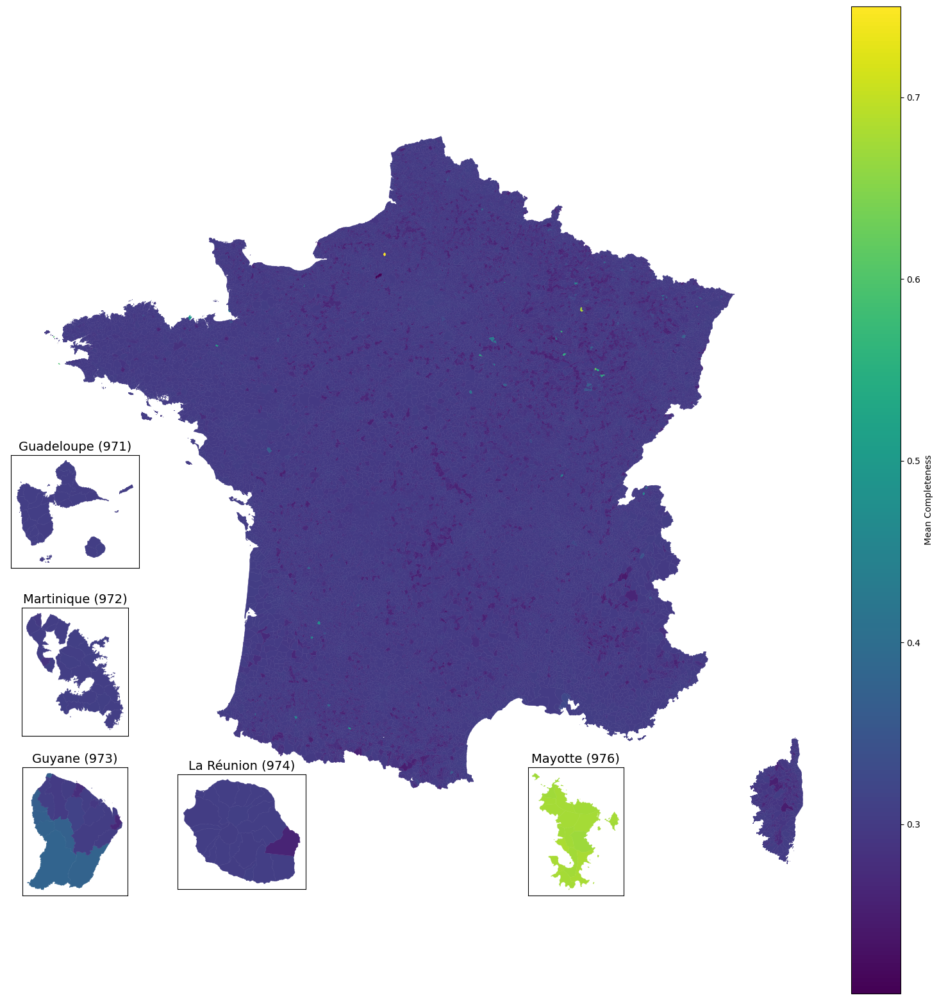

In [102]:

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Assuming plot_map_compl is a GeoDataFrame
fig, ax = plt.subplots(1, figsize=(20, 20))

# Calculate global min and max for consistent color scaling
vmin = plot_map_compl["mean_compl"].min()
vmax = plot_map_compl["mean_compl"].max()

cmap = 'viridis'

# Plot mainland France
mainland_plot = plot_map_compl[~plot_map_compl["DEPARTEMENT"].isin(['971', '972', '973', '974', '976'])].plot(
    column="mean_compl", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
)

ax.axis("off")

inset_positions = [
    [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],
    [0, 0.2, 2, 2, '972', 'Martinique (972)'],
    [0, 0, 2, 2, '973', 'Guyane (973)'],
    [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    [0.6, 0, 2, 2, '976', 'Mayotte (976)']
]

# Create the insets
for pos in inset_positions:
    ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                                  bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                                  bbox_transform=ax.transAxes)
            
    plot_map_compl[plot_map_compl["DEPARTEMENT"] == pos[4]].plot(
                column="mean_compl", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
            )
            
    ax_inset.axis("on")  # Turn on the axis to show the frame
    ax_inset.set_xticks([])  # Remove x-axis ticks
    ax_inset.set_yticks([])  # Remove y-axis ticks
            
            # Add department number on top of each inset plot with larger font
    ax_inset.set_title(pos[5], fontsize=14, pad=5)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, label="Mean Completeness", pad=0.01)
plt.savefig(f'plots/map_plots/completeness_map_cmap_{cmap}.png', dpi=100, bbox_inches='tight')
# plt.tight_layout()
plt.show()


# Prepare tax data

In [134]:
columns_for_total = ["POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL", # do not change first column, it will change the sum 9 cells lower
    "FNB - COMMUNE / MONTANT REEL",
    "TAFNB - COMMUNE / MONTANT REEL NET",
    "FB - COMMUNE / MONTANT REEL",
    "TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT",
    "CFE - COMMUNE / PRODUIT REEL NET",
                     
                    "Part de CVAE au profit de la commune",
                    "DCRTP / Commune"]

In [135]:
query = f"""
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    {", ".join(f'"{col}"' for col in columns_for_total)},
    "ANNEE"
FROM francetax
"""
total_tax_data = client.query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Query: 
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    "POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL", "FNB - COMMUNE / MONTANT REEL", "TAFNB - COMMUNE / MONTANT REEL NET", "FB - COMMUNE / MONTANT REEL", "TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT", "CFE - COMMUNE / PRODUIT REEL NET", "Part de CVAE au profit de la commune", "DCRTP / Commune",
    "ANNEE"
FROM francetax



In [136]:
total_tax_data['COMMUNE'] = total_tax_data['COMMUNE'].astype('str')

In [137]:
total_tax_data = pd.merge(total_tax_data, commune_code.loc[:,['DEPARTEMENT', 'COMMUNE', 'code INSEE']], how='inner', on=['DEPARTEMENT', 'COMMUNE'])
if total_tax_data['code INSEE'].isna().any():
    raise Exception('code INSEE has NULL values')

In [138]:
total_tax_data.fillna(0, inplace=True)

In [139]:
total_tax_data.replace(to_replace=['.', ','], value=0, inplace=True)

In [140]:
total_tax_data.drop_duplicates(inplace=True)
total_tax_data['Commune name'] = total_tax_data['Commune name'].apply(str.strip)
total_tax_data['Commune name'] = total_tax_data['Commune name'].str.replace(r'\bST\b', 'SAINT', regex=True)

In [141]:
total_tax_data[columns_for_total] = total_tax_data[columns_for_total].astype('float64')

In [142]:
# Frank to Euro conversion for data before 2002
total_tax_data.loc[total_tax_data['ANNEE'] < 2002, columns_for_total[1:]] = (total_tax_data[total_tax_data['ANNEE'] < 2002][columns_for_total[1:]] / 6.55957).astype('int')

In [143]:
total_tax_data['All taxes'] = total_tax_data[columns_for_total[1:]].sum(axis=1) # it will change sum here

In [144]:
taxes_per_commune = commune_code.copy()
# add mean and sum column for taxes
taxes_per_commune = pd.merge(taxes_per_commune, total_tax_data.groupby('code INSEE')['All taxes'].mean(), on='code INSEE')
taxes_per_commune.rename({'All taxes':'Mean'}, axis=1, inplace=True)
taxes_per_commune = pd.merge(taxes_per_commune, total_tax_data.groupby('code INSEE')['All taxes'].sum(), on='code INSEE')
taxes_per_commune.rename({'All taxes':'Sum'}, axis=1, inplace=True)
# add last avaliable year and how many years commune is present
taxes_per_commune = pd.merge(taxes_per_commune, total_tax_data.groupby('code INSEE')['ANNEE'].max(), on='code INSEE')
taxes_per_commune.rename({'ANNEE':'Year_max'}, axis=1, inplace=True)
taxes_per_commune = pd.merge(taxes_per_commune, total_tax_data.groupby('code INSEE')['ANNEE'].max() - total_tax_data.groupby('code INSEE')['ANNEE'].min(), on='code INSEE')
taxes_per_commune.rename({'ANNEE':'Year_count'}, axis=1, inplace=True)

In [145]:
taxes_per_commune.sort_values('Sum', ascending=False, inplace=True)
taxes_per_commune.reset_index(drop=True, inplace=True)

## TOP 5 plots

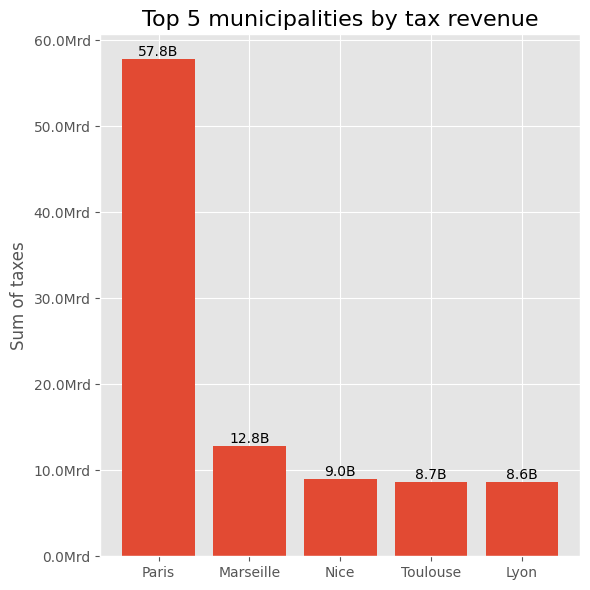

In [71]:
# Set the style and font that supports French characters
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Get the data
top_5_data = taxes_per_commune.head(5)

french_names = {
    'VILLE DE PARIS': 'Paris',
    'MARSEILLE': 'Marseille',
    'TOULOUSE': 'Toulouse',
    'NICE': 'Nice',
    'LYON': 'Lyon'
}
# Create the bar plot
fig, ax = plt.subplots(figsize=(6, 6))
bars = ax.bar(top_5_data['name'], top_5_data['Sum'])

# Customize the plot
ax.set_title('Top 5 municipalities by tax revenue', fontsize=16)
# ax.set_xlabel('Commune', fontsize=12)
ax.set_ylabel('Sum of taxes', fontsize=12)

# Format y-axis labels to show billions
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e9:.1f}Mrd'))

# Capitalize commune names and don't rotate
plt.xticks(range(len(top_5_data['name'])), [french_names[name] for name in top_5_data['name']], rotation=0)

# Add value labels on top of each bar (in billions)
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{height/1e9:.1f}B',
            ha='center', va='bottom')

plt.tight_layout()
# plt.savefig("plots/Top 5 municipalities by tax revenue.png", dpi=150)
plt.show()


In [22]:
bottom_5_data['name'].values

NameError: name 'bottom_5_data' is not defined

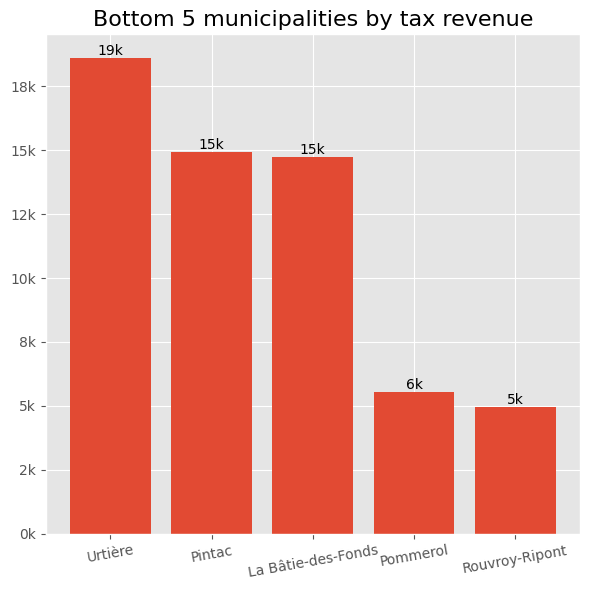

In [188]:
# Set the style and font that supports French characters
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Get the data
bottom_5_data = taxes_per_commune[taxes_per_commune['Year_count'] == 40].tail(5)

# Create a dictionary to map names to their French versions
french_names = {
    'URTIERE': 'Urtière',
    'PINTAC': 'Pintac',
    'LA BATIE DES FONDS': 'La Bâtie-des-Fonds',
    'POMMEROL': 'Pommerol',
    'ROUVROY RIPONT': 'Rouvroy-Ripont'
}

# Create the bar plot
fig, ax = plt.subplots(figsize=(6, 6))
bars = ax.bar(bottom_5_data['name'].map(french_names), bottom_5_data['Sum'])

# Customize the plot
ax.set_title('Bottom 5 municipalities by tax revenue', fontsize=16)

# Format y-axis labels to show thousands
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e3:.0f}k'))

# Use French names for x-axis labels
plt.xticks(range(len(bottom_5_data['name'])), [french_names[name] for name in bottom_5_data['name']], rotation=10)

# Add value labels on top of each bar (in thousands)
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{height/1e3:.0f}k',
            ha='center', va='bottom')

plt.tight_layout()
# plt.savefig("plots/Bottom 5 municipalities by tax revenue.png", dpi=150)
plt.show()


In [20]:
top_5_data[['name', 'Sum']]

,name,Sum
0,PARIS,57795539550
1,MARSEILLE,12767259799
2,NICE,8953902997
3,TOULOUSE,8678888783
4,LYON,8627758866


In [21]:
bottom_5_data[['name', 'Sum']]

NameError: name 'bottom_5_data' is not defined

In [22]:
taxes_per_commune.columns

Index(['name', 'code INSEE', 'DEPARTEMENT', 'COMMUNE', 'Mean', 'Sum',
       'Year_max', 'Year_count'],
      dtype='object')

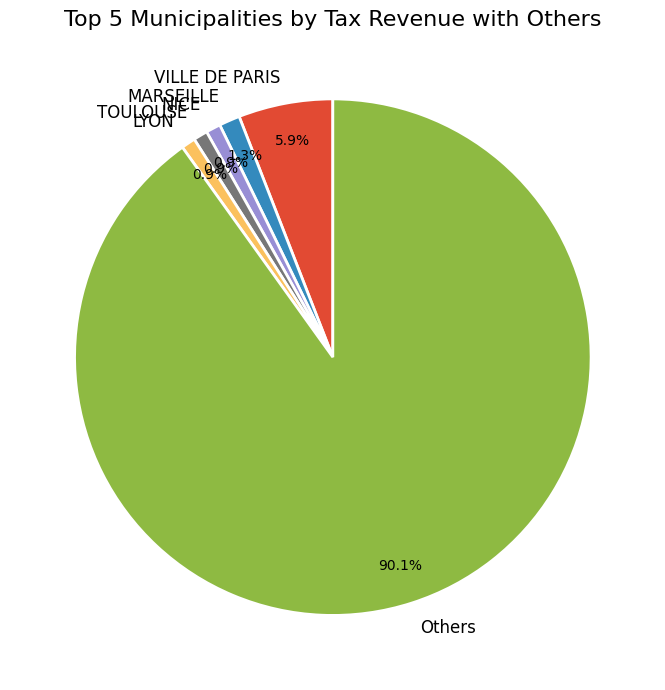

In [25]:
import matplotlib.pyplot as plt

# Set the style and font that supports French characters
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Sort the data by 'Sum' in descending order and get the top 5
top_5_data = taxes_per_commune.nlargest(5, 'Sum')
top_5_sums = top_5_data['Sum']
top_5_names = top_5_data['name']

# Calculate the sum of the remaining values
others_sum = taxes_per_commune['Sum'].sum() - top_5_sums.sum()

# Combine the top 5 sums with the "Others" category
sums = top_5_sums.tolist() + [others_sum]
names = top_5_names.tolist() + ['Others']

# Create the pie chart
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(
    sums,
    labels=names,
    autopct='%1.1f%%',
    startangle=90,
    wedgeprops={'edgecolor': 'w', 'linewidth': 2},
    pctdistance=0.85,
    labeldistance=1.1
)

# Customize the plot
ax.set_title('Top 5 Municipalities by Tax Revenue with Others', fontsize=16)

# Style the labels and percentages
for text in texts:
    text.set_fontsize(12)
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('black')

plt.tight_layout()
plt.show()


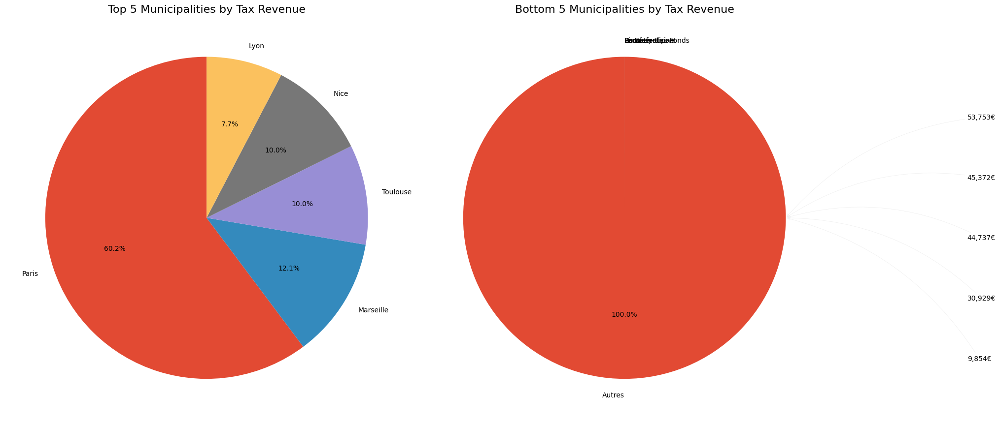

In [81]:
# Set the style and font that supports French characters
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Define French names
french_names = {
    'VILLE DE PARIS': 'Paris',
    'MARSEILLE': 'Marseille',
    'TOULOUSE': 'Toulouse',
    'NICE': 'Nice',
    'LYON': 'Lyon',
    'PINTAC': 'Pintac',
    'LA BATIE DES FONDS': 'La Bâtie-des-Fonds',
    'RONDEFONTAINE': 'Rondefontaine',
    'ROUVROY RIPONT': 'Rouvroy-Ripont',
    'POMMEROL': 'Pommerol'
}

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Top 5 Pie Chart
top_5_sizes = top_5_data['Sum']
top_5_labels = [french_names[name] for name in top_5_data['name']]
ax1.pie(top_5_sizes, labels=top_5_labels, autopct='%1.1f%%', startangle=90)
ax1.set_title('Top 5 Municipalities by Tax Revenue', fontsize=16)

# Bottom 5 Pie Chart
bottom_5_sizes = bottom_5_data['Sum']
bottom_5_labels = [french_names[name] for name in bottom_5_data['name']]
other_sum = bottom_5_data['Sum'].sum()
sizes = [other_sum] + [1] * 5  # Make the small slices visible
labels = ['Autres'] + bottom_5_labels
ax2.pie(sizes, labels=labels, autopct=lambda pct: f'{pct:.1f}%' if pct > 1 else '', startangle=90)
ax2.set_title('Bottom 5 Municipalities by Tax Revenue', fontsize=16)

# Add a line to point to the small slice
for i in range(1, 6):
    ax2.annotate(f'{bottom_5_sizes.iloc[i-1]:,.0f}€', 
                 xy=(1, 0), 
                 xytext=(1.35, 0.9 - i*0.15),
                 textcoords='axes fraction',
                 ha='left', va='center',
                 arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2'))

plt.tight_layout()
plt.show()

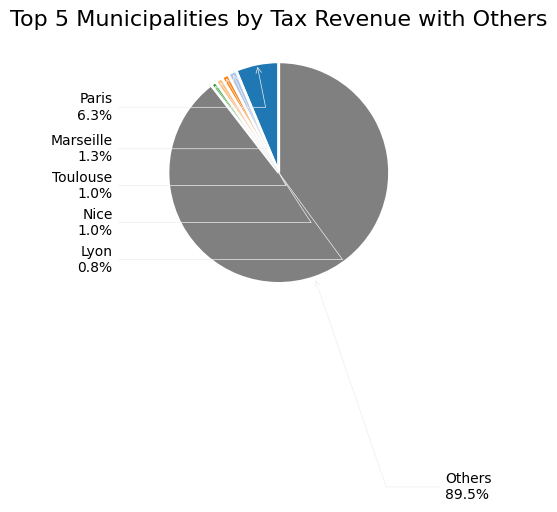

In [119]:
# Set the style and font that supports French characters
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Sort the data by 'Sum' in descending order and get the top 5
top_5_data = taxes_per_commune.nlargest(5, 'Sum')
top_5_sums = top_5_data['Sum']
top_5_names = top_5_data['name']

# Calculate the sum of the remaining values
others_sum = taxes_per_commune['Sum'].sum() - top_5_sums.sum()

# Combine the top 5 sums with the "Others" category
sums = top_5_sums.tolist() + [others_sum]
names = top_5_names.tolist() + ['Others']

# Define colors
colors = plt.cm.tab20.colors[:5] + ('gray',)

# Create the pie chart
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts = ax.pie(
    sums,
    colors=colors,
    startangle=90,
    wedgeprops={'edgecolor': 'w', 'linewidth': 2}
)

# Customize the plot
ax.set_title('Top 5 Municipalities by Tax Revenue with Others', fontsize=16)

# Annotate each wedge
french_names = {
    'VILLE DE PARIS': 'Paris',
    'MARSEILLE': 'Marseille',
    'TOULOUSE': 'Toulouse',
    'NICE': 'Nice',
    'LYON': 'Lyon'
}

for i, (wedge, name, sum_value) in enumerate(zip(wedges, names, sums)):
    ang = (wedge.theta2 - wedge.theta1) / 2 + wedge.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    percent = (sum_value / sum(sums)) * 100
    display_name = french_names.get(name, name)
    ax.annotate(f'{display_name}\n{percent:.1f}%',
                xy=(x, y), xytext=(1.5 * np.sign(x), 1 * y - 0.3 * i - 0.5),
                horizontalalignment=horizontalalignment,
                arrowprops=dict(arrowstyle="->", connectionstyle=connectionstyle))




plt.tight_layout()
plt.show()


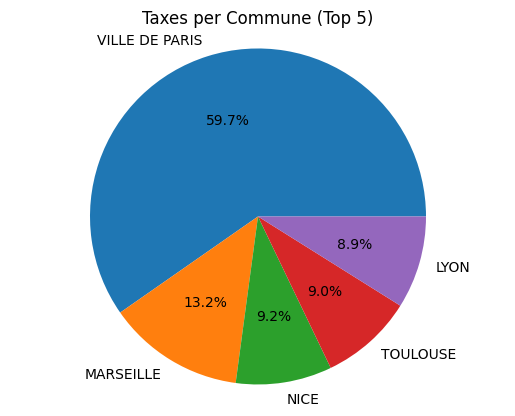

In [97]:
data = taxes_per_commune.head(5)
plt.pie(data['Sum'], labels=data['name'], autopct='%1.1f%%')
plt.title('Taxes per Commune (Top 5)')
plt.axis('equal')
plt.show()

In [192]:

grouped = total_tax_data.groupby('code INSEE')

for col in columns_for_total:
    percent_tax = (grouped[col].sum() / grouped['All taxes'].sum() * 100).rename(f'{col}_percent')
    taxes_per_commune = pd.merge(taxes_per_commune, percent_tax, on='code INSEE')


<Axes: xlabel='ANNEE'>

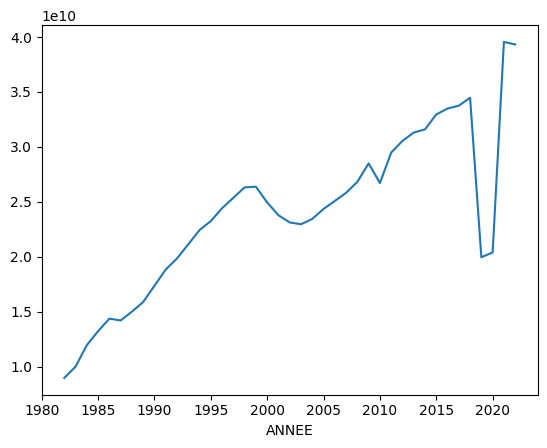

In [96]:
total_tax_data.groupby('ANNEE')['All taxes'].sum().plot()

In [38]:
total_tax_data.columns

Index(['Commune name', 'DEPARTEMENT', 'COMMUNE',
       'FNB - COMMUNE / MONTANT REEL', 'TAFNB - COMMUNE / MONTANT REEL NET',
       'FB - COMMUNE / MONTANT REEL',
       'TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT',
       'CFE - COMMUNE / PRODUIT REEL NET', 'IFER TOTALE / COMMUNE',
       'Part de CVAE au profit de la commune', 'ANNEE', 'code INSEE',
       'All taxes'],
      dtype='object')

In [41]:
total_tax_data[total_tax_data['code INSEE'] =='77105'][['Commune name', 'code INSEE']]

,Commune name,code INSEE
644124,CHAUCONIN NEUFMONTIERS,77105
680795,CHAUCONIN NEUFMONTIERS,77105
717464,CHAUCONIN NEUFMONTIERS,77105
754033,CHAUCONIN NEUFMONTIERS,77105
790602,CHAUCONIN NEUFMONTIERS,77105


## Revenue Trends

### Revenue Trend for Top 5 Communes

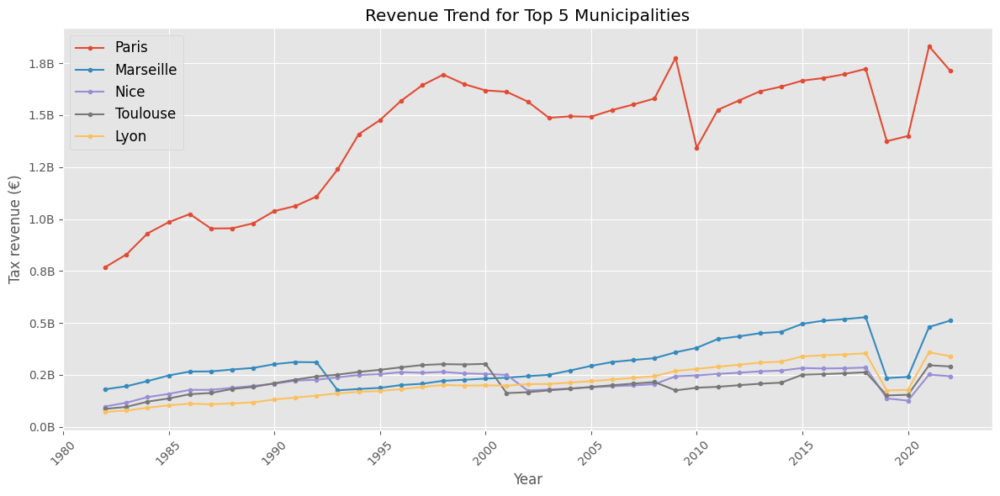

In [192]:
french_names = {
    'VILLE DE PARIS': 'Paris',
    'MARSEILLE': 'Marseille',
    'TOULOUSE': 'Toulouse',
    'NICE': 'Nice',
    'LYON': 'Lyon'
}

top_5_communes = taxes_per_commune['code INSEE'].head(5)
filtered_df = total_tax_data[total_tax_data['code INSEE'].isin(top_5_communes)]

plt.figure(figsize=(12, 6))
for commune in top_5_communes:
    data = filtered_df[filtered_df['code INSEE'] == commune]
    plt.plot(data['ANNEE'], data['All taxes'], marker='.', 
             label=french_names.get(data['Commune name'].iloc[0], data['Commune name'].iloc[0]))

plt.title('Revenue Trend for Top 5 Municipalities')
plt.xlabel('Year')
plt.ylabel('Tax revenue (€)')
plt.legend(fontsize=12)  # Increased fontsize for legend labels
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e9:.1f}B'))
plt.tight_layout()
# plt.savefig('plots/Revenue Trend for Top 5 Communes.png', dpi=150)
plt.show()

### Revenue Trend for Bottom 5 Communes

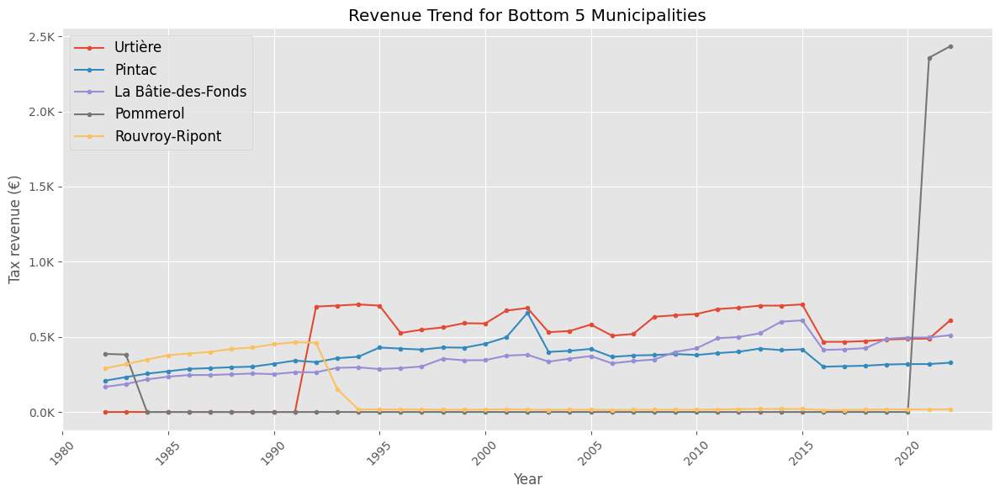

In [194]:
french_names = {
    'PINTAC': 'Pintac',
    'LA BATIE DES FONDS': 'La Bâtie-des-Fonds',
    'RONDEFONTAINE': 'Rondefontaine',
    'ROUVROY RIPONT': 'Rouvroy-Ripont',
    'POMMEROL': 'Pommerol',
    'URTIERE': 'Urtière'
}

bottom_5_communes = taxes_per_commune[taxes_per_commune['Year_count'] == 40].tail(5)['code INSEE']
filtered_df = total_tax_data[total_tax_data['code INSEE'].isin(bottom_5_communes)]

plt.figure(figsize=(12, 6))
for commune in bottom_5_communes:
    data = filtered_df[filtered_df['code INSEE'] == commune]
    plt.plot(data['ANNEE'], data['All taxes'], marker='.', 
             label=french_names.get(data['Commune name'].iloc[0], data['Commune name'].iloc[0]))

plt.title('Revenue Trend for Bottom 5 Municipalities')
plt.xlabel('Year')
plt.ylabel('Tax revenue (€)')
plt.legend(fontsize=12)  # Increased fontsize for legend labels
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e3:.1f}K'))

plt.tight_layout()
# plt.savefig('plots/Revenue Trend for Bottom 5 Communes.png', dpi=150)
plt.show()

### Revenue drop 2001-2002

In [153]:
total_tax_data[total_tax_data['ANNEE'] == 2022].groupby('code INSEE').sum().sum()

Commune name                                                                          ABERGEMENT CLEMENCIATABERGEMENT DE VAREYAMBERI...
DEPARTEMENT                                                                           1111111111111111111111111111111111111111111111...
COMMUNE                                                                               1245678910111213141516171921222324252627282930...
POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL                                           68441515.0
FNB - COMMUNE / MONTANT REEL                                                                                                897408127.0
TAFNB - COMMUNE / MONTANT REEL NET                                                                                            4119714.0
FB - COMMUNE / MONTANT REEL                                                                                               33832964218.0
TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT

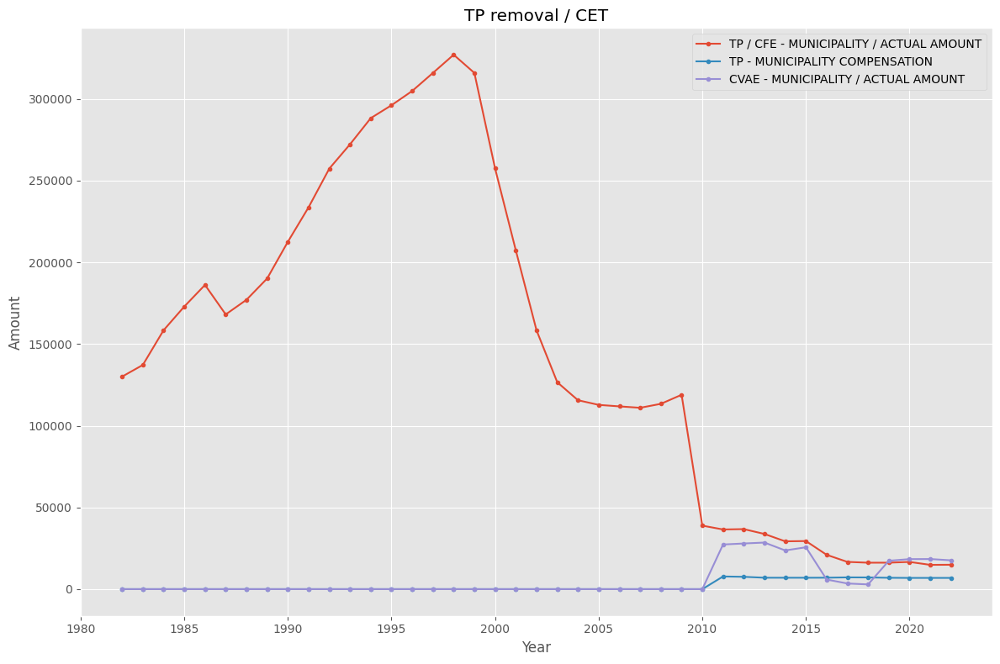

In [150]:
grouped_data = total_tax_data[[*columns_for_total[1:], 'ANNEE']].groupby(['ANNEE']).mean()

short_names = {
    'FNB - COMMUNE / MONTANT REEL': 'FNB - MUNICIPALITY / ACTUAL AMOUNT',
    'TAFNB - COMMUNE / MONTANT REEL NET': 'TAFNB - MUNICIPALITY / ACTUAL AMOUNT',
    'FB - COMMUNE / MONTANT REEL': 'FB - MUNICIPALITY / ACTUAL AMOUNT',
    'TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT': 'TH - MUNICIPALITY / ACTUAL AMOUNT',
    'CFE - COMMUNE / PRODUIT REEL NET': 'TP / CFE - MUNICIPALITY / ACTUAL AMOUNT',
    'DCRTP / Commune': 'TP - MUNICIPALITY COMPENSATION',
    'Part de CVAE au profit de la commune': 'CVAE - MUNICIPALITY / ACTUAL AMOUNT'
}
grouped_data = grouped_data.rename(columns=short_names)
grouped_data = grouped_data[['TP / CFE - MUNICIPALITY / ACTUAL AMOUNT', 'TP - MUNICIPALITY COMPENSATION', "CVAE - MUNICIPALITY / ACTUAL AMOUNT"]]
# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot each column
for column in grouped_data.columns:
    ax.plot(grouped_data.index, grouped_data[column], marker='.', label=column)

# Customize the plot
ax.set_xlabel('Year')
ax.set_ylabel('Amount')
ax.set_title('Tax Amount by Year')
ax.legend(loc='best')
ax.grid(True)

# Rotate x-axis labels for better readability
# plt.xticks(rotation=45)

# Adjust layout to prevent cutting off labels
plt.tight_layout()
# plt.savefig('plots/Tax Amount by Year.png', dpi=150)
# Show the plot
plt.show()

## Revenue Growth

Categorize municipalities based on their tax revenue growth over the past 5, 10, 15, and 20 years.

In [223]:
rev_growth = commune_code.copy()
for i in range(2022, 2001, -5):
    rev_growth = pd.merge(rev_growth, total_tax_data[total_tax_data['ANNEE'] == i][['code INSEE', 'All taxes']], on='code INSEE', how='left')
    if i != 2022:
        rev_growth[f'DELTA {i} {2022}'] = (rev_growth[f'Revenue in {2022}'] / rev_growth['All taxes']).replace([np.inf, -np.inf], np.nan)
    rev_growth.rename(columns={'All taxes': f'Revenue in {i}'}, inplace=True)

In [224]:
rev_growth

,name,code INSEE,DEPARTEMENT,COMMUNE,Revenue in 2022,Revenue in 2017,DELTA 2017 2022,Revenue in 2012,DELTA 2012 2022,Revenue in 2007,DELTA 2007 2022,Revenue in 2002,DELTA 2002 2022
0,MAZAN L ABBAYE,07154,7,154,106980.0,74359.0,1.438696,87882.0,1.217314,55779.0,1.917926,74522.0,1.435549
1,MEYRAS,07156,7,156,429654.0,194844.0,2.205118,188598.0,2.278147,256785.0,1.673205,232620.0,1.847021
2,PAILHARES,07170,7,170,105933.0,67097.0,1.578804,59336.0,1.785307,47134.0,2.247486,45650.0,2.320548
3,PLATS,07177,7,177,252961.0,189406.0,1.335549,150264.0,1.683444,109571.0,2.308649,114565.0,2.208013
4,PRANLES,07184,7,184,112168.0,66306.0,1.691672,92248.0,1.215940,53026.0,2.115340,40582.0,2.763984
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36817,TROIS BASSINS,97923,979,23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36818,MOLINGHEM,62575,62,575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36819,BAN SUR MEURTHE,88034,88,34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36820,REPARA (LA),26265,26,265,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [234]:
rev_growth = rev_growth[rev_growth['code INSEE'] != '73230']

In [229]:
rev_growth = rev_growth.dropna()

In [236]:
# Assuming rev_growth is your Pandas DataFrame

# Filter numeric columns
numeric_columns = rev_growth.select_dtypes(include='number').columns

# Include 'DEPARTEMENT' in the columns to keep
columns_to_keep = ['DEPARTEMENT'] + list(numeric_columns)

# Filter the DataFrame to keep only the necessary columns
filtered_df = rev_growth[columns_to_keep]

# Perform the groupby, mean, and sort operations
result = (
    filtered_df
    .groupby('DEPARTEMENT')
    .mean()
    .sort_values('DELTA 2002 2022', ascending=False)
)


In [253]:
rev_growth.sort_values('DELTA 2002 2022', ascending=False).head(10)[['name', 'code INSEE', 'Revenue in 2002', 'Revenue in 2022', 'DELTA 2002 2022']]

,name,code INSEE,Revenue in 2002,Revenue in 2022,DELTA 2002 2022
12075,DEMANDOLX,04069,763.0,171445.0,224.698558
19814,BOURNIQUEL,24060,218.0,39228.0,179.944954
32552,SILLY EN GOUFFERN,61474,5501.0,958694.0,174.276313
24854,AUVILLERS LES FORGES,08037,1230.0,180855.0,147.036585
17621,BEAUMONT HAGUE,50041,169440.0,21536376.0,127.103258
11435,MONTEREAU SUR LE JARD,77306,18994.0,1875843.0,98.759766
10224,ROCHEBRUNE,05121,1760.0,163143.0,92.694886
13339,SINNAMARY,97312,34969.0,3113812.0,89.044926
25715,AURENSAN,32017,427.0,37618.0,88.098361
14566,SAINT GEORGES,32377,730.0,63389.0,86.834247


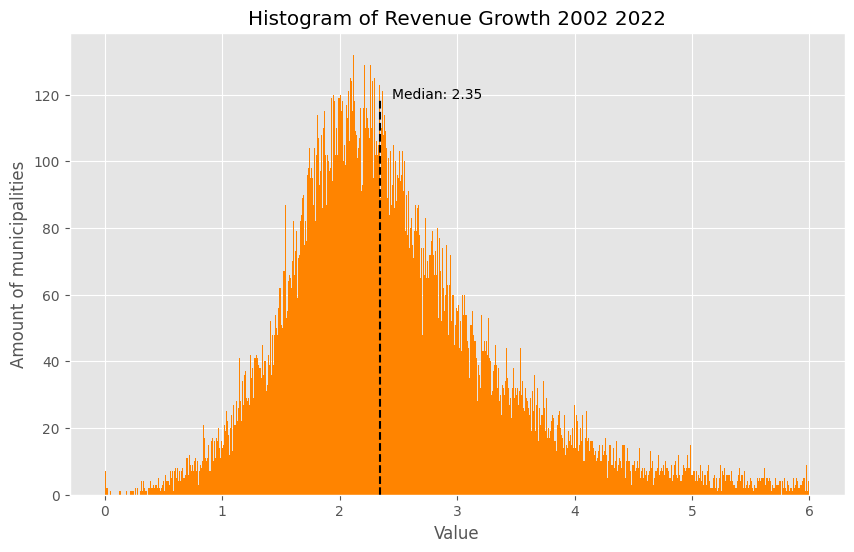

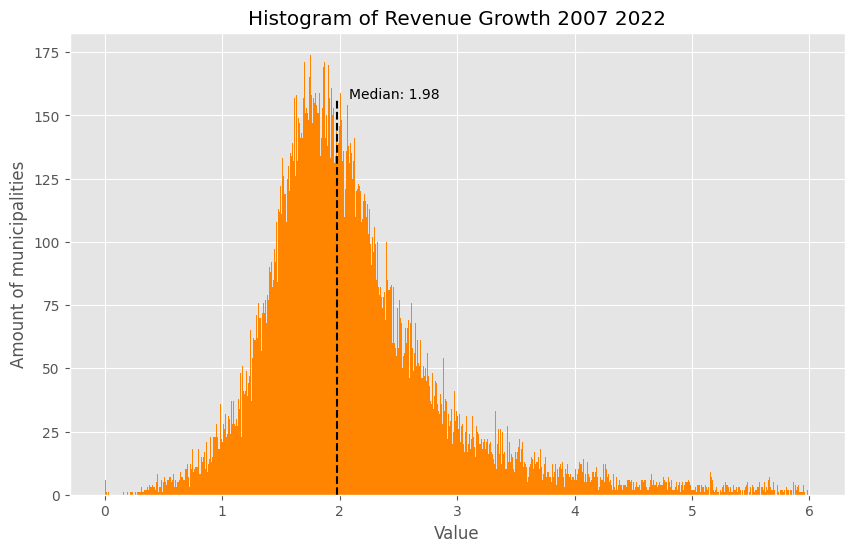

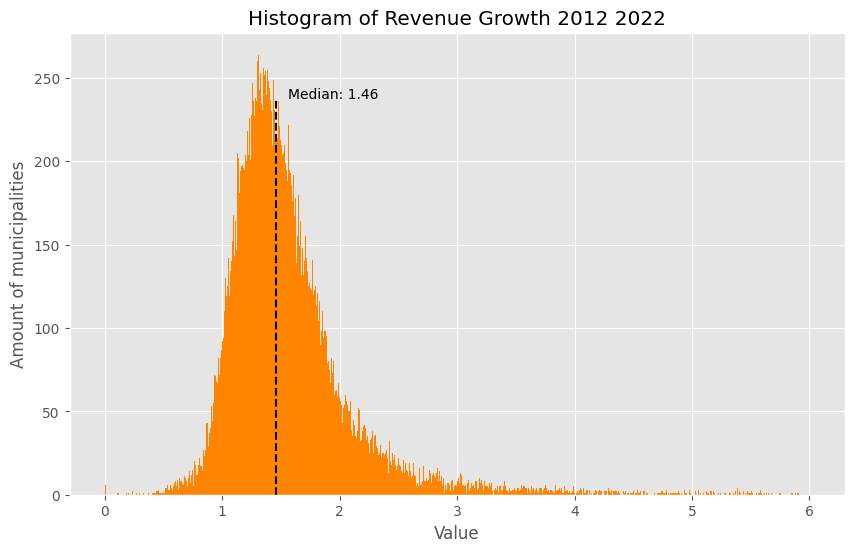

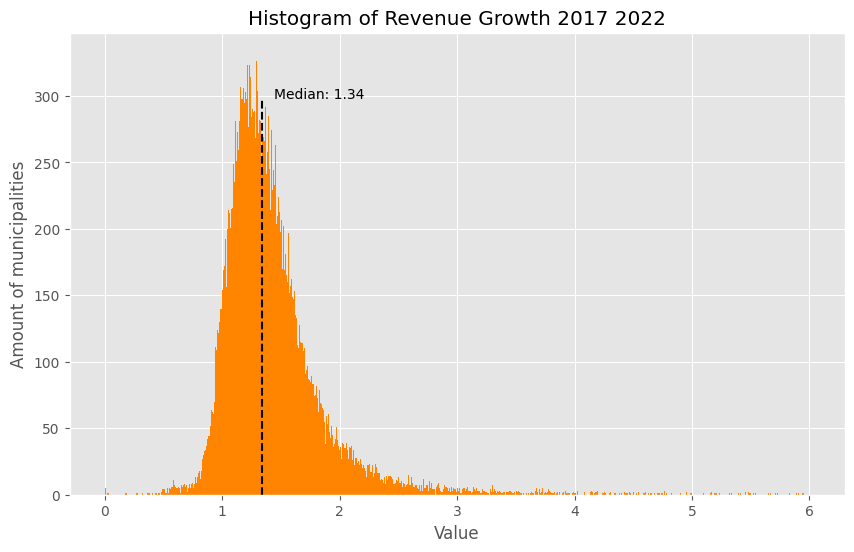

In [239]:
deltas_list = ['DELTA 2002 2022', 'DELTA 2007 2022', 'DELTA 2012 2022', 'DELTA 2017 2022']

for delta in deltas_list:
# Filter and drop NaN values
    plot_data = rev_growth[delta].dropna()
    
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot the histogram
    ymax = ax.hist(plot_data, bins=1000, range=[0, 6], color='#ff8400')[0].max()
    
    # Get the median value
    median_value = plot_data.median()
    
    # Add a vertical line at the median
    ax.vlines([median_value], ymin=0, ymax=ymax*0.9, colors=['black'], linestyle='--')
    
    # Add text for the median
    ax.text(median_value + 0.1, ymax * 0.9, f"Median: {median_value:.2f}", color='black')
    
    # Customize the plot
    ax.set_xlabel('Value')
    ax.set_ylabel('Amount of municipalities')
    ax.set_title(f'Histogram of Revenue Growth {delta.split()[1]} {delta.split()[2]}', )
    
    plt.savefig(f'plots/Histogram of Revenue Growth {delta.split()[1]} {delta.split()[2]}.png', dpi=150)

    # Show the plot
plt.show()


## Making France COMMUNE map

## Load map data

In [240]:
map_data = gpd.read_file('data_used/map/COMMUNE_FRMETDROM.shp')

In [241]:
map_data['NOM_M'] = map_data['NOM_M'].str.replace(r'-', ' ', regex=True)

In [242]:
def combine_arrondissements(map_data, city_name, insee_com):
    """
    Combine arrondissements of a specified city into a single row in the GeoDataFrame.
    
    Parameters:
    map_data (GeoDataFrame): The original GeoDataFrame containing city data.
    city_name (str): The name of the city (e.g., 'PARIS', 'LYON', 'MARSEILLE').
    insee_com (str): The INSEE code for the combined city.
    
    Returns:
    GeoDataFrame: Updated GeoDataFrame with combined city data.
    """
    # Filter arrondissements of the specified city
    city_arr = map_data[map_data['NOM_M'].str.contains(f'{city_name}', case=False) & 
                        map_data['NOM_M'].str.contains('ARRONDISSEMENT', case=False)]
    
    # Combine geometries
    combined_geometry = unary_union(city_arr['geometry'])
    
    # Create a new row for the combined city
    city_row = {
        'ID': f'{city_name}_COMBINED',
        'INSEE_COM': insee_com,
        'NOM': city_name.capitalize(),
        'NOM_M': city_name.upper(),
        'STATUT': city_arr['STATUT'].iloc[0],  # Assuming all arrondissements have the same status
        'INSEE_REG': city_arr['INSEE_REG'].iloc[0],
        'INSEE_DEP': city_arr['INSEE_DEP'].iloc[0],
        'INSEE_CAN': city_arr['INSEE_CAN'].iloc[0],
        'INSEE_ARR': city_arr['INSEE_ARR'].iloc[0],
        'SIREN_EPCI': city_arr['SIREN_EPCI'].iloc[0],
        'POPULATION': city_arr['POPULATION'].sum(),
        'TYPE': 'COM',
        'geometry': combined_geometry
    }
    
    # Remove individual arrondissements
    map_data = map_data[~map_data.index.isin(city_arr.index)]
    
    # Add the new combined city row
    new_city_gdf = gpd.GeoDataFrame([city_row], geometry='geometry', crs=map_data.crs)
    map_data = pd.concat([map_data, new_city_gdf], ignore_index=True)
    
    # Reset the index
    map_data = map_data.reset_index(drop=True)
    
    # Ensure the result is a GeoDataFrame with the correct CRS
    map_data = gpd.GeoDataFrame(map_data, geometry='geometry', crs=map_data.crs)
    
    return map_data

In [243]:
# Combine Paris arrondissements
map_data = combine_arrondissements(map_data, 'PARIS', '75056')

# Combine Lyon arrondissements
map_data = combine_arrondissements(map_data, 'LYON', '69123')

# Combine Marseille arrondissements
map_data = combine_arrondissements(map_data, 'MARSEILLE', '13055')

In [244]:
rev_growth['DELTA 2002 2022'] = rev_growth['Revenue in 2022']/rev_growth['Revenue in 2002']

C:\Users\lazzz\AppData\Local\Temp\ipykernel_9172\4118845987.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rev_growth['DELTA 2002 2022'] = rev_growth['Revenue in 2022']/rev_growth['Revenue in 2002']


In [245]:
plot_data = pd.merge(rev_growth, map_data, how='left', left_on='code INSEE', right_on='INSEE_COM')
plot_data = gpd.geodataframe.GeoDataFrame(plot_data)

In [247]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Calculate global min and max for consistent color scaling
deltas_list = ['DELTA 2002 2022', 'DELTA 2007 2022', 'DELTA 2012 2022', 'DELTA 2017 2022']


for delta in deltas_list:

    vmin = plot_data[delta].quantile(0.01)
    vmax = plot_data[delta].quantile(0.99)


    fig, ax = plt.subplots(1, figsize=(20, 20))
      
    # Plot mainland France
    mainland_plot = plot_data[~plot_data["DEPARTEMENT"].isin(['971', '972', '973', '974', '976', '977', '978'])].plot(
        column=delta, ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
    )
    
    # Capture the mappable object from the plot
    mainland_mappable = mainland_plot.get_children()[0]
    
    ax.axis("off")
    
    inset_positions = [
        [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],  # [left, bottom, width, height, department, department name]
        [0, 0.2, 2, 2, '972', 'Martinique (972)'],
        [0, 0, 2, 2, '973', 'Guyane (973)'],
        [0.2, 0, 2, 2, '974', 'La Réunion (974)']
]
    # Create the insets
    for pos in inset_positions:
        ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                              bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                              bbox_transform=ax.transAxes)
        
        plot_data[plot_data["DEPARTEMENT"] == pos[4]].plot(
            column=delta, ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
        )
        
        ax_inset.axis("on")  # Turn on the axis to show the frame
        ax_inset.set_xticks([])  # Remove x-axis ticks
        ax_inset.set_yticks([])  # Remove y-axis ticks
        
        # Add department number on top of each inset plot with larger font
        ax_inset.set_title(pos[5], fontsize=14, pad=5)
    
    # Add a colorbar
    cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    cbar = plt.colorbar(mainland_mappable, cax=cax)
    cbar.ax.tick_params(labelsize=14)  # Increase colorbar tick label size
    
    # Add title to the map
    plt.suptitle(f"Revenue Growth {delta.split()[1]} - {delta.split()[2]}", fontsize=30, y=0.9)
    
    output_folder = "plots/map_plots/revenue_growth"
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f"Revenue Growth {delta.split()[1]} - {delta.split()[2]}.png")
    plt.savefig(output_path, bbox_inches="tight", dpi=200)
    plt.close(fig)
    plt.show()
# Adjust layout and display the plot
# plt.tight_layout()
# plt.show()

# Population correlation

In [33]:
total_tax_data.rename(columns={'POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL': 'POPULATION'}, inplace=True)

In [38]:
correlations = total_tax_data[total_tax_data['ANNEE'] >= 1996][['POPULATION', 'All taxes', 'code INSEE']].groupby('code INSEE').corr()

correlations.reset_index(inplace=True)

correlations = correlations[correlations['level_1'] == 'POPULATION'][['code INSEE', 'All taxes']]

correlations.reset_index(inplace=True, drop=True)

correlations.rename(columns={'All taxes': 'Correlation'}, inplace=True)

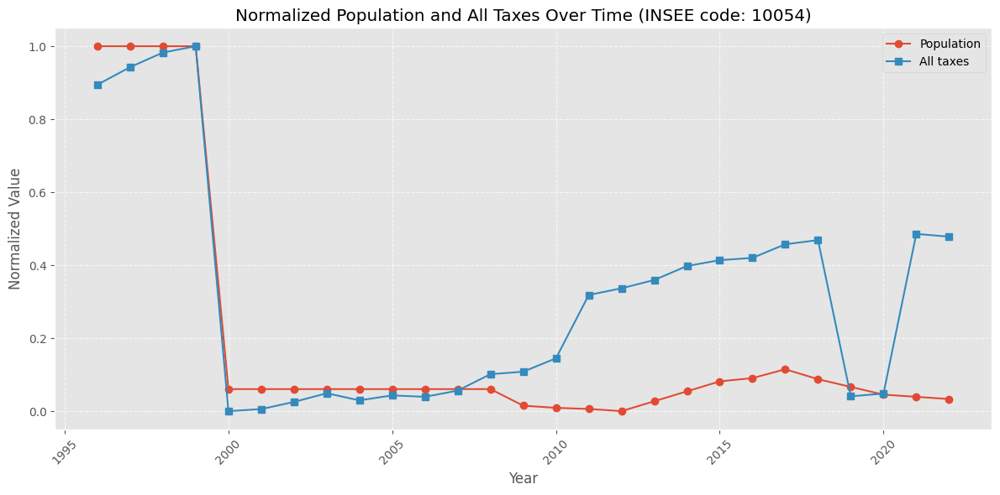

In [39]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Filter the data for the specific INSEE code
data = total_tax_data[(total_tax_data['code INSEE'] == '10054') & (total_tax_data['ANNEE'] >= 1996)][['POPULATION', 'All taxes', 'ANNEE']]

# Sort the data by ANNEE
data = data.sort_values('ANNEE')

# Normalize the 'POPULATION' and 'All taxes' columns
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(data[['POPULATION', 'All taxes']])

# Create a new DataFrame with normalized values
normalized_df = pd.DataFrame(normalized_data, columns=['Normalized Population', 'Normalized All taxes'])
normalized_df['ANNEE'] = data['ANNEE'].values

# Create the plot
fig, ax = plt.subplots(figsize=(12, 6))

# Plot normalized population
ax.plot(normalized_df['ANNEE'], normalized_df['Normalized Population'], marker='o', label='Population')

# Plot normalized all taxes
ax.plot(normalized_df['ANNEE'], normalized_df['Normalized All taxes'], marker='s', label='All taxes')

# Customize the plot
ax.set_xlabel('Year')
ax.set_ylabel('Normalized Value')
ax.set_title('Normalized Population and All Taxes Over Time (INSEE code: 10054)')
ax.legend()
ax.grid(True, linestyle='--', alpha=0.7)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()

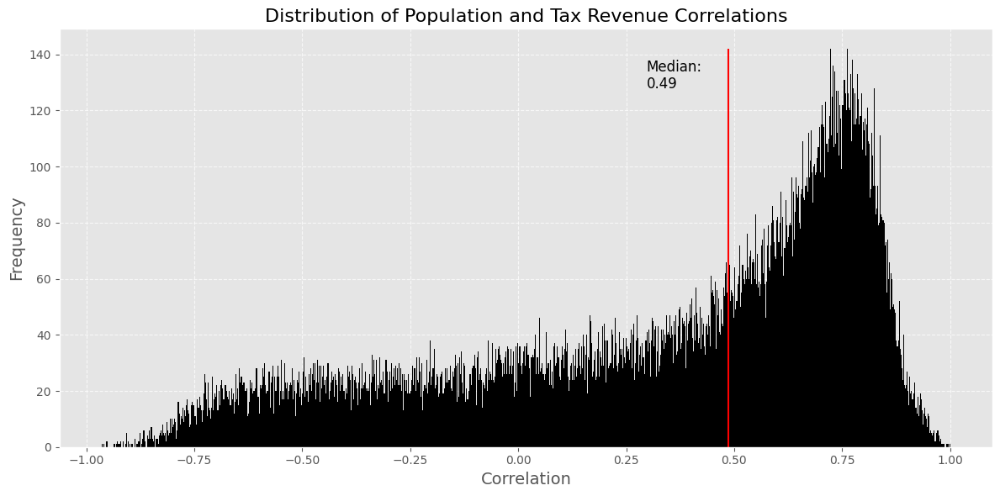

In [40]:
import matplotlib.pyplot as plt

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the histogram
ymax = ax.hist(correlations['Correlation'], bins=1000, color='black', edgecolor=None)[0].max()

median_value = correlations['Correlation'].median()

# Add a title and labels
ax.set_title('Distribution of Population and Tax Revenue Correlations', fontsize=16)
ax.set_xlabel('Correlation', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.vlines(median_value, ymin=0, ymax=ymax, colors=['red'])
ax.text(median_value * 0.61, ymax * 0.9, f'Median:\n{median_value:.2f}', fontsize=12)

# Add grid lines
ax.grid(True, linestyle='--', alpha=0.7)

# Set x and y axis limits if needed (optional)
# ax.set_xlim([-1, 1])
# ax.set_ylim([0, max_count])

# Show the plot
plt.tight_layout()
plt.savefig('plots/Distribution of Population and Tax Revenue Correlations.png', dpi = 150)
plt.show()


In [41]:
map_data = gpd.read_file('data_used/map/COMMUNE_FRMETDROM.shp')

In [42]:
map_data['NOM_M'] = map_data['NOM_M'].str.replace(r'-', ' ', regex=True)

In [43]:
def combine_arrondissements(map_data, city_name, insee_com):
    """
    Combine arrondissements of a specified city into a single row in the GeoDataFrame.
    
    Parameters:
    map_data (GeoDataFrame): The original GeoDataFrame containing city data.
    city_name (str): The name of the city (e.g., 'PARIS', 'LYON', 'MARSEILLE').
    insee_com (str): The INSEE code for the combined city.
    
    Returns:
    GeoDataFrame: Updated GeoDataFrame with combined city data.
    """
    # Filter arrondissements of the specified city
    city_arr = map_data[map_data['NOM_M'].str.contains(f'{city_name}', case=False) & 
                        map_data['NOM_M'].str.contains('ARRONDISSEMENT', case=False)]
    
    # Combine geometries
    combined_geometry = unary_union(city_arr['geometry'])
    
    # Create a new row for the combined city
    city_row = {
        'ID': f'{city_name}_COMBINED',
        'INSEE_COM': insee_com,
        'NOM': city_name.capitalize(),
        'NOM_M': city_name.upper(),
        'STATUT': city_arr['STATUT'].iloc[0],  # Assuming all arrondissements have the same status
        'INSEE_REG': city_arr['INSEE_REG'].iloc[0],
        'INSEE_DEP': city_arr['INSEE_DEP'].iloc[0],
        'INSEE_CAN': city_arr['INSEE_CAN'].iloc[0],
        'INSEE_ARR': city_arr['INSEE_ARR'].iloc[0],
        'SIREN_EPCI': city_arr['SIREN_EPCI'].iloc[0],
        'POPULATION': city_arr['POPULATION'].sum(),
        'TYPE': 'COM',
        'geometry': combined_geometry
    }
    
    # Remove individual arrondissements
    map_data = map_data[~map_data.index.isin(city_arr.index)]
    
    # Add the new combined city row
    new_city_gdf = gpd.GeoDataFrame([city_row], geometry='geometry', crs=map_data.crs)
    map_data = pd.concat([map_data, new_city_gdf], ignore_index=True)
    
    # Reset the index
    map_data = map_data.reset_index(drop=True)
    
    # Ensure the result is a GeoDataFrame with the correct CRS
    map_data = gpd.GeoDataFrame(map_data, geometry='geometry', crs=map_data.crs)
    
    return map_data

In [44]:
# Combine Paris arrondissements
map_data = combine_arrondissements(map_data, 'PARIS', '75056')

# Combine Lyon arrondissements
map_data = combine_arrondissements(map_data, 'LYON', '69123')

# Combine Marseille arrondissements
map_data = combine_arrondissements(map_data, 'MARSEILLE', '13055')

In [45]:
plot_data = pd.merge(correlations, map_data, how='left', left_on='code INSEE', right_on='INSEE_COM')
plot_data = gpd.geodataframe.GeoDataFrame(plot_data)

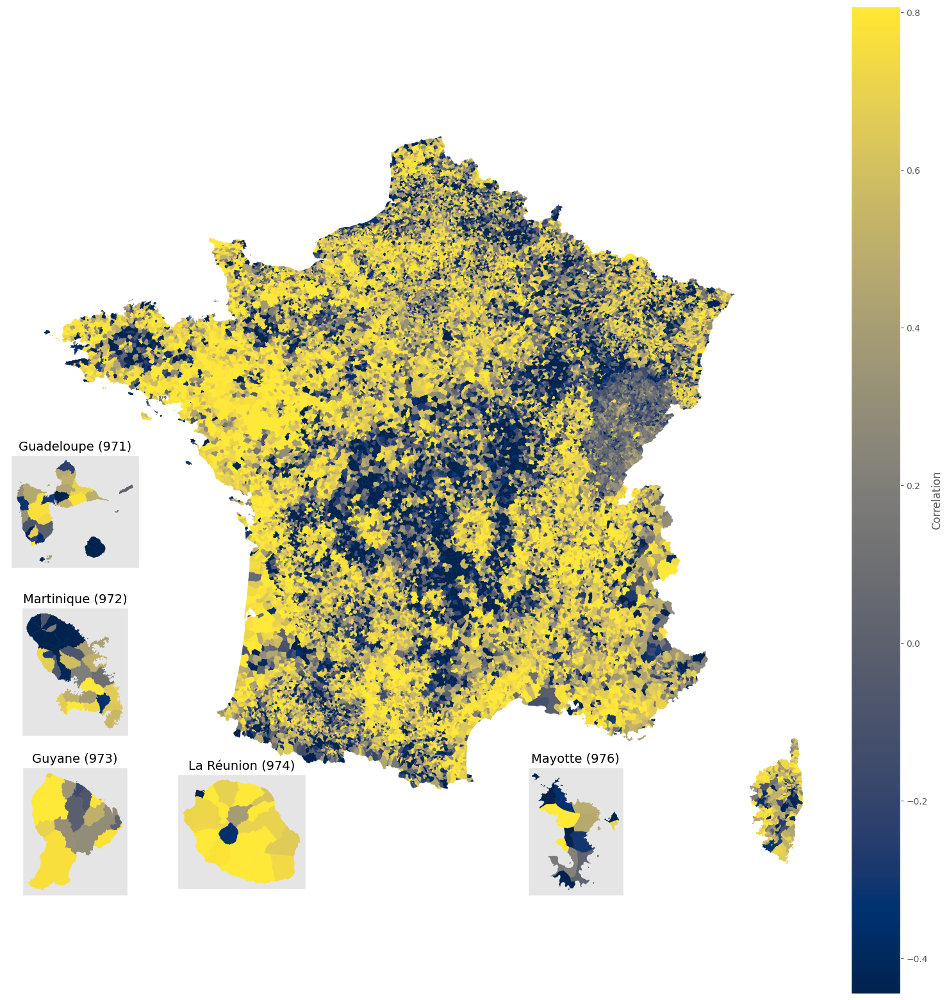

In [46]:

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Assuming plot_map_compl is a GeoDataFrame
fig, ax = plt.subplots(1, figsize=(20, 20))

# Calculate global min and max for consistent color scaling
vmin = plot_data["Correlation"].quantile(0.1)
vmax = plot_data["Correlation"].quantile(0.9)

cmap = 'cividis'

# Plot mainland France
mainland_plot = plot_data[~plot_data["INSEE_DEP"].isin(['971', '972', '973', '974', '976'])].plot(
    column="Correlation", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
)

ax.axis("off")

inset_positions = [
    [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],
    [0, 0.2, 2, 2, '972', 'Martinique (972)'],
    [0, 0, 2, 2, '973', 'Guyane (973)'],
    [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    [0.6, 0, 2, 2, '976', 'Mayotte (976)']
]

# Create the insets
for pos in inset_positions:
    ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                                  bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                                  bbox_transform=ax.transAxes)
            
    plot_data[plot_data["INSEE_DEP"] == pos[4]].plot(
                column="Correlation", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
            )
            
    ax_inset.axis("on")  # Turn on the axis to show the frame
    ax_inset.set_xticks([])  # Remove x-axis ticks
    ax_inset.set_yticks([])  # Remove y-axis ticks
            
            # Add department number on top of each inset plot with larger font
    ax_inset.set_title(pos[5], fontsize=14, pad=5)

# Add a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, label="Correlation", pad=0.01)
plt.savefig(f'plots/map_plots/population_revenue_corr_{cmap}.png', dpi=100, bbox_inches='tight')
# plt.tight_layout()
plt.show()


# Significant Taxes

In [90]:
# "Part de CVAE au profit du GFP"
# "Valeur locative moyenne TEOM N - INTERCOMMUNALITE",
# "TASCOM au profit du GFP"
# "FNB - GEMAPI / MONTANT REEL INTERCOMMUNALITE"
# "FB - GEMAPI / MONTANT REEL INTERCOMMUNALITE"




tax_types = [
    "FNB - COMMUNE / MONTANT REEL",
    "TAFNB - COMMUNE / MONTANT REEL NET",
    "FB - COMMUNE / MONTANT REEL",
    "TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT",
    "CFE - COMMUNE / PRODUIT REEL NET",
    "Part de CVAE au profit de la commune", 
    "FNB - TSE / MONTANT REEL",
    "FB - TSE / MONTANT REEL",
    "FB - TSE AUTRES / MONTANT REEL NET",
    "Valeur locative moyenne TEOM N - COMMUNE",   
    "IFER TOTALE / COMMUNE",
    "TASCOM au profit de la commune"
]

In [42]:
# "Part de CVAE au profit du GFP"
# "Valeur locative moyenne TEOM N - INTERCOMMUNALITE",
# "TASCOM au profit du GFP"
# "FNB - GEMAPI / MONTANT REEL INTERCOMMUNALITE"
# "FB - GEMAPI / MONTANT REEL INTERCOMMUNALITE"




tax_types = [
    "FNB - SYNDICATS ET ORG.ASSIMILES /  MONTANT REEL",
    "FB - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL",
    "TH - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL",
    "CFE - SYNDICATS ET ORG. ASSIMILES /  PRODUIT REEL NET"
]

In [91]:
query = f"""
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    {", ".join(f'"{col}"' for col in tax_types)},
    "ANNEE"
FROM francetax
"""
significant_tax = client.query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Query: 
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    "FNB - COMMUNE / MONTANT REEL", "TAFNB - COMMUNE / MONTANT REEL NET", "FB - COMMUNE / MONTANT REEL", "TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT", "CFE - COMMUNE / PRODUIT REEL NET", "Part de CVAE au profit de la commune", "FNB - TSE / MONTANT REEL", "FB - TSE / MONTANT REEL", "FB - TSE AUTRES / MONTANT REEL NET", "Valeur locative moyenne TEOM N - COMMUNE", "IFER

In [92]:
significant_tax.fillna(0, inplace=True)

In [93]:
significant_tax.replace(to_replace=['.', ','], value=0, inplace=True)

In [94]:
significant_tax.drop_duplicates(inplace=True)

In [95]:
significant_tax[tax_types] = significant_tax[tax_types].astype('float64').astype('int64')

In [96]:
significant_tax = pd.merge(significant_tax, commune_code.loc[:,['DEPARTEMENT', 'COMMUNE', 'code INSEE']], how='inner', on=['DEPARTEMENT', 'COMMUNE'])

In [97]:
# significant_tax = significant_tax[(significant_tax[tax_types] != 0).all(axis=1)]

In [99]:
significant_tax = significant_tax[(significant_tax[["FNB - COMMUNE / MONTANT REEL",
    "FB - COMMUNE / MONTANT REEL",
    "TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT",
    "CFE - COMMUNE / PRODUIT REEL NET"]] != 0).all(axis=1)]

## Sum Taxes 

In [100]:
data = significant_tax.groupby('ANNEE').sum()[[*tax_types]].reset_index(drop=True)

In [101]:
data['FB - TSE / MONTANT REEL'] = data['FB - TSE / MONTANT REEL'] + data['FB - TSE AUTRES / MONTANT REEL NET']
data.drop('FB - TSE AUTRES / MONTANT REEL NET', axis=1, inplace=True)

In [102]:
data.rename(columns={
    'FNB - COMMUNE / MONTANT REEL': 'FNB',
    'TAFNB - COMMUNE / MONTANT REEL NET': 'TAFNB',
    'FB - COMMUNE / MONTANT REEL': 'FB',
    'TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT': 'TH',
    'CFE - COMMUNE / PRODUIT REEL NET': 'CFE',
    'Part de CVAE au profit de la commune': 'CVAE',
    'FNB - TSE / MONTANT REEL': 'TSE - FNB',
    'FB - TSE / MONTANT REEL': 'TSE - FB',
    'Valeur locative moyenne TEOM N - COMMUNE': 'TEOM',
    'IFER TOTALE / COMMUNE': 'IFER',
    'TASCOM au profit de la commune': 'TASCOM'
}, inplace=True)

In [67]:
data.rename(columns={
    "FNB - SYNDICATS ET ORG.ASSIMILES /  MONTANT REEL": "FNB",
    "FB - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL": "FB",
    "TH - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL": "TH",
    "CFE - SYNDICATS ET ORG. ASSIMILES /  PRODUIT REEL NET": "CFE"
}, inplace=True)

In [103]:
data.sum() / data.sum().sum()

FNB          0.033865
TAFNB        0.000042
FB           0.262102
TH           0.242276
CFE          0.457948
CVAE         0.002598
TSE - FNB    0.000036
TSE - FB     0.000881
TEOM         0.000003
IFER         0.000016
TASCOM       0.000233
dtype: float64

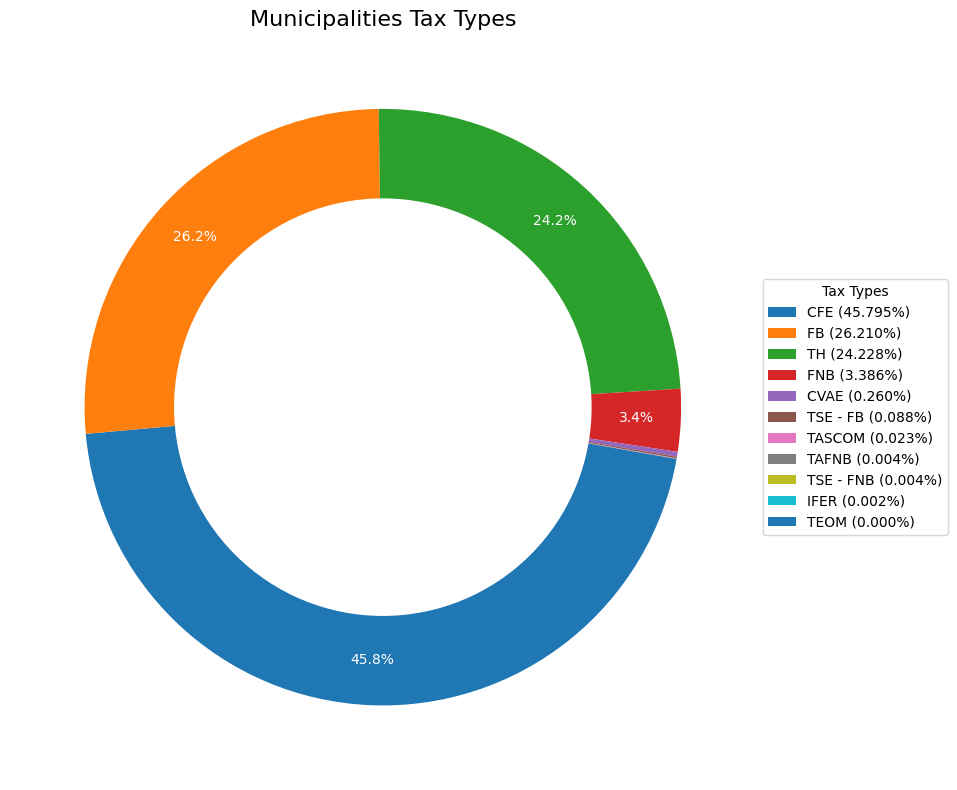

In [105]:
fig, ax = plt.subplots(figsize=(10, 8))

# Calculate percentages and sort in descending order
total = data.sum()
percentages = (total / total.sum() * 100).round(3)
sorted_data = total.sort_values(ascending=False)
sorted_percentages = percentages[sorted_data.index]

# Function to format the autopct labels
def make_autopct(values):
    def my_autopct(pct):
        return f'{pct:.1f}%' if pct >= 0.6 else ''
    return my_autopct

# Create the pie chart
wedges, texts, autotexts = ax.pie(sorted_data.values, 
                                  labels=sorted_data.index,
                                  autopct=make_autopct(sorted_data.values),
                                  textprops=dict(color="w"),
                                  pctdistance=0.85,
                                  startangle=-10,
                                  counterclock=False)

# Add a circle at the center to create a donut chart
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)

# Create legend labels with percentages in descending order
legend_labels = [f'{index} ({value:.3f}%)' for index, value in sorted_percentages.items()]

# Add legend with percentages
ax.legend(wedges, legend_labels,
          title="Tax Types",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

# Add title
plt.title("Municipalities Tax Types", fontsize=16, loc='center')

# Adjust layout to prevent cutting off labels
plt.tight_layout()
# plt.savefig('plots/labor_union_tax_types_2022.png', dpi=150)
# Show the plot
plt.show()

## Taxes by commune

In [109]:
signf_tax_commune = significant_tax[[*tax_types, 'code INSEE']].groupby('code INSEE').sum().reset_index()

In [110]:
signf_tax_commune['FB - TSE / MONTANT REEL'] = signf_tax_commune['FB - TSE / MONTANT REEL'] + signf_tax_commune['FB - TSE AUTRES / MONTANT REEL NET']
signf_tax_commune.drop('FB - TSE AUTRES / MONTANT REEL NET', axis=1, inplace=True)

In [111]:
signf_tax_commune.rename(columns={
    'FNB - COMMUNE / MONTANT REEL': 'FNB',
    'TAFNB - COMMUNE / MONTANT REEL NET': 'TAFNB',
    'FB - COMMUNE / MONTANT REEL': 'FB',
    'TH - COMMUNE / MONTANT REEL DONT THP/E AU PROFIT DE L ETAT': 'TH',
    'CFE - COMMUNE / PRODUIT REEL NET': 'CFE',
    'Part de CVAE au profit de la commune': 'CVAE',
    'FNB - TSE / MONTANT REEL': 'TSE - FNB',
    'FB - TSE / MONTANT REEL': 'TSE - FB',
    'Valeur locative moyenne TEOM N - COMMUNE': 'TEOM',
    'IFER TOTALE / COMMUNE': 'IFER',
    'TASCOM au profit de la commune': 'TASCOM'
}, inplace=True)

In [71]:
signf_tax_commune.rename(columns={
    "FNB - SYNDICATS ET ORG.ASSIMILES /  MONTANT REEL": "FNB",
    "FB - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL": "FB",
    "TH - SYNDICATS ET ORG. ASSIMILES /  MONTANT REEL": "TH",
    "CFE - SYNDICATS ET ORG. ASSIMILES /  PRODUIT REEL NET": "CFE"
}, inplace=True)

In [112]:
# Assuming your DataFrame is named signf_tax_commune
# List of columns to consider (excluding 'code INSEE')
tax_columns = ['FNB', 'TAFNB', 'FB', 'TH', 'CFE', 'CVAE', 'TSE - FNB',
               'TSE - FB', 'TEOM', 'IFER', 'TASCOM']

# Create a dictionary mapping column names to numbers
column_to_number = {col: i+1 for i, col in enumerate(tax_columns)}

# Function to get the column name with the maximum value
def get_max_column(row):
    return row[tax_columns].idxmax()

# Create a new DataFrame with 'code INSEE' and the number of the max value column
result_df = pd.DataFrame({
    'code INSEE': signf_tax_commune['code INSEE'],
    'max_tax_type': signf_tax_commune[tax_columns].idxmax(axis=1).map(column_to_number)
})


In [72]:
# Assuming your DataFrame is named signf_tax_commune
# List of columns to consider (excluding 'code INSEE')
tax_columns = ['FNB', 'FB', 'TH', 'CFE']

# Create a dictionary mapping column names to numbers
column_to_number = {col: i+1 for i, col in enumerate(tax_columns)}

# Function to get the column name with the maximum value
def get_max_column(row):
    return row[tax_columns].idxmax()

# Create a new DataFrame with 'code INSEE' and the number of the max value column
result_df = pd.DataFrame({
    'code INSEE': signf_tax_commune['code INSEE'],
    'max_tax_type': signf_tax_commune[tax_columns].idxmax(axis=1).map(column_to_number)
})

In [113]:
signf_tax_commune[['FNB', 'FB', 'TH', 'CFE']].sum()

FNB      84955195099
FB      657520865360
TH      607784987532
CFE    1148830687604
dtype: int64

In [27]:
signf_tax_commune[['FNB', 'FB', 'TH', 'CFE']].sum()/signf_tax_commune[['FNB', 'FB', 'TH', 'CFE']].sum().sum()

FNB    0.052541
FB     0.295799
TH     0.266039
CFE    0.385621
dtype: float64

In [115]:
column_to_number

{'FNB': 1,
 'TAFNB': 2,
 'FB': 3,
 'TH': 4,
 'CFE': 5,
 'CVAE': 6,
 'TSE - FNB': 7,
 'TSE - FB': 8,
 'TEOM': 9,
 'IFER': 10,
 'TASCOM': 11}

In [114]:
result_df['max_tax_type'].value_counts()/len(result_df['max_tax_type'])*100

max_tax_type
1    35.191828
5    25.711313
4    25.371745
3    13.725114
Name: count, dtype: float64

In [348]:
map_data = gpd.read_file('data_used/map/COMMUNE_FRMETDROM.shp')

In [349]:
map_data['NOM_M'] = map_data['NOM_M'].str.replace(r'-', ' ', regex=True)

In [350]:
def combine_arrondissements(map_data, city_name, insee_com):
    """
    Combine arrondissements of a specified city into a single row in the GeoDataFrame.
    
    Parameters:
    map_data (GeoDataFrame): The original GeoDataFrame containing city data.
    city_name (str): The name of the city (e.g., 'PARIS', 'LYON', 'MARSEILLE').
    insee_com (str): The INSEE code for the combined city.
    
    Returns:
    GeoDataFrame: Updated GeoDataFrame with combined city data.
    """
    # Filter arrondissements of the specified city
    city_arr = map_data[map_data['NOM_M'].str.contains(f'{city_name}', case=False) & 
                        map_data['NOM_M'].str.contains('ARRONDISSEMENT', case=False)]
    
    # Combine geometries
    combined_geometry = unary_union(city_arr['geometry'])
    
    # Create a new row for the combined city
    city_row = {
        'ID': f'{city_name}_COMBINED',
        'INSEE_COM': insee_com,
        'NOM': city_name.capitalize(),
        'NOM_M': city_name.upper(),
        'STATUT': city_arr['STATUT'].iloc[0],  # Assuming all arrondissements have the same status
        'INSEE_REG': city_arr['INSEE_REG'].iloc[0],
        'INSEE_DEP': city_arr['INSEE_DEP'].iloc[0],
        'INSEE_CAN': city_arr['INSEE_CAN'].iloc[0],
        'INSEE_ARR': city_arr['INSEE_ARR'].iloc[0],
        'SIREN_EPCI': city_arr['SIREN_EPCI'].iloc[0],
        'POPULATION': city_arr['POPULATION'].sum(),
        'TYPE': 'COM',
        'geometry': combined_geometry
    }
    
    # Remove individual arrondissements
    map_data = map_data[~map_data.index.isin(city_arr.index)]
    
    # Add the new combined city row
    new_city_gdf = gpd.GeoDataFrame([city_row], geometry='geometry', crs=map_data.crs)
    map_data = pd.concat([map_data, new_city_gdf], ignore_index=True)
    
    # Reset the index
    map_data = map_data.reset_index(drop=True)
    
    # Ensure the result is a GeoDataFrame with the correct CRS
    map_data = gpd.GeoDataFrame(map_data, geometry='geometry', crs=map_data.crs)
    
    return map_data

In [351]:
# Combine Paris arrondissements
map_data = combine_arrondissements(map_data, 'PARIS', '75056')

# Combine Lyon arrondissements
map_data = combine_arrondissements(map_data, 'LYON', '69123')

# Combine Marseille arrondissements
map_data = combine_arrondissements(map_data, 'MARSEILLE', '13055')

In [352]:
plot_data = pd.merge(result_df, map_data, how='left', left_on='code INSEE', right_on='INSEE_COM')
plot_data = gpd.geodataframe.GeoDataFrame(plot_data)

In [353]:
plot_data = plot_data[~plot_data['max_tax_type'].isin([8,10])]
plot_data.loc[plot_data['max_tax_type'].isin([4, 5, 3]), 'max_tax_type'] = plot_data.loc[plot_data['max_tax_type'].isin([4, 5, 3]), 'max_tax_type'].apply(lambda x: int(x-1))

In [354]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# Assuming plot_data is a GeoDataFrame
fig, ax = plt.subplots(1, figsize=(20, 20))

# Calculate global min and max for consistent color scaling
vmin = plot_data["max_tax_type"].min()
vmax = plot_data["max_tax_type"].max()

custom_colors = ['#cc5121', '#ffda2b', '#82ac26', '#4f4085']  # Light Salmon, Pale Green, Light Sky Blue, Plum
cmap = ListedColormap(custom_colors)

# Plot mainland France
mainland_plot = plot_data[~plot_data["INSEE_DEP"].isin(['971', '972', '973', '974', '976'])].plot(
    column="max_tax_type", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
)

ax.axis("off")

inset_positions = [
    [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],
    [0, 0.2, 2, 2, '972', 'Martinique (972)'],
    [0, 0, 2, 2, '973', 'Guyane (973)'],
    [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    [0.6, 0, 2, 2, '976', 'Mayotte (976)']
]

# Create the insets
for pos in inset_positions:
    ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                          bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                          bbox_transform=ax.transAxes)
    
    plot_data[plot_data["INSEE_DEP"] == pos[4]].plot(
        column="max_tax_type", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap=cmap
    )
    
    ax_inset.axis("on")  # Turn on the axis to show the frame
    ax_inset.set_xticks([])  # Remove x-axis ticks
    ax_inset.set_yticks([])  # Remove y-axis ticks
    
    # Add department number on top of each inset plot with larger font
    ax_inset.set_title(pos[5], fontsize=14, pad=5)

# Add a colorbar without ticks and labels
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label("Tax type", fontsize=20)

# Remove ticks and labels from colorbar
cbar.set_ticks([])
cbar.outline.set_visible(False)  # Remove the outline of the colorbar

# Add custom labels to the colorbar
tax_types = ['FNB', 'FB', 'TH', 'CFE']  # Adjust these labels as needed
cbar_ax = cbar.ax
cbar_ax.text(0.5, 0.125, tax_types[0], ha='center', va='center', transform=cbar_ax.transAxes, fontsize=20)
cbar_ax.text(0.5, 0.375, tax_types[1], ha='center', va='center', transform=cbar_ax.transAxes, fontsize=20)
cbar_ax.text(0.5, 0.625, tax_types[2], ha='center', va='center', transform=cbar_ax.transAxes, fontsize=20)
cbar_ax.text(0.5, 0.875, tax_types[3], ha='center', va='center', transform=cbar_ax.transAxes, fontsize=20)

# plt.savefig('plots/map_plots/significant_taxes.png', dpi=150)
# plt.tight_layout()
plt.show()


KeyboardInterrupt



<Axes: >

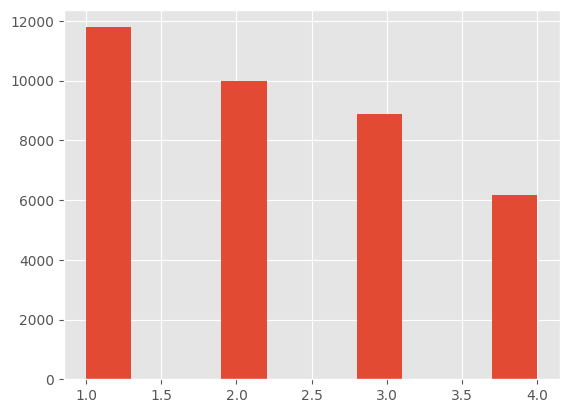

In [363]:
plot_data['max_tax_type'].hist()

In [364]:
plot_data['max_tax_type'].value_counts()/len(plot_data)

max_tax_type
1    0.320106
2    0.271029
3    0.241587
4    0.167278
Name: count, dtype: float64

# Taxe proffesionnelle

In [59]:
tax_proff = ["DCRTP / Commune", "DCRTP / INTERCOMMUNALITE", "DCRTP / DEPARTEMENT", "TP - SOMME DES ALLOCATIONS COMPENSATRICES / REG"]
query = f"""
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    {", ".join(f'"{col}"' for col in tax_proff)},
    "ANNEE"
FROM francetax
"""
prof_tax = client.query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Query: 
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    "DCRTP / Commune", "DCRTP / INTERCOMMUNALITE", "DCRTP / DEPARTEMENT", "TP - SOMME DES ALLOCATIONS COMPENSATRICES / REG",
    "ANNEE"
FROM francetax



In [60]:
prof_tax

,Commune name,DEPARTEMENT,COMMUNE,DCRTP / Commune,DCRTP / INTERCOMMUNALITE,DCRTP / DEPARTEMENT,TP - SOMME DES ALLOCATIONS COMPENSATRICES / REG,ANNEE
0,ABERGEMENT CLEMENCIAT,1,1,0.0,21814.0,10406508.0,0.0,2022
1,ABERGEMENT DE VAREY,1,2,0.0,0.0,10406508.0,0.0,2022
2,AMBERIEU EN BUGEY,1,4,39749.0,0.0,10406508.0,0.0,2022
3,AMBERIEUX EN DOMBES,1,5,0.0,135343.0,10406508.0,0.0,2022
4,AMBLEON,1,6,0.0,147370.0,10406508.0,0.0,2022
...,...,...,...,...,...,...,...,...
1528917,SAINTE SUZANNE,974,20,NaN,NaN,NaN,None,1982
1528918,SALAZIE,974,21,NaN,NaN,NaN,None,1982
1528919,TAMPON,974,22,NaN,NaN,NaN,None,1982
1528920,TROIS BASSINS,974,23,NaN,NaN,NaN,None,1982


In [61]:
prof_tax[[*tax_proff, 'ANNEE']].groupby('ANNEE').sum()

,DCRTP / Commune,DCRTP / INTERCOMMUNALITE,DCRTP / DEPARTEMENT,TP - SOMME DES ALLOCATIONS COMPENSATRICES / REG
ANNEE,,,,
1982,0.0,0.000000e+00,0.000000e+00,0
1983,0.0,0.000000e+00,0.000000e+00,0
1984,0.0,0.000000e+00,0.000000e+00,0
1985,0.0,0.000000e+00,0.000000e+00,0
1986,0.0,0.000000e+00,0.000000e+00,0
1987,0.0,0.000000e+00,0.000000e+00,0
1988,0.0,0.000000e+00,0.000000e+00,0
1989,0.0,0.000000e+00,0.000000e+00,0
1990,0.0,0.000000e+00,0.000000e+00,0


# MAPS

## Making France COMMUNE map

## Load map data

In [30]:
map_data = gpd.read_file('data_used/map/COMMUNE_FRMETDROM.shp')

In [31]:
map_data['NOM_M'] = map_data['NOM_M'].str.replace(r'-', ' ', regex=True)

In [33]:
def combine_arrondissements(map_data, city_name, insee_com):
    """
    Combine arrondissements of a specified city into a single row in the GeoDataFrame.
    
    Parameters:
    map_data (GeoDataFrame): The original GeoDataFrame containing city data.
    city_name (str): The name of the city (e.g., 'PARIS', 'LYON', 'MARSEILLE').
    insee_com (str): The INSEE code for the combined city.
    
    Returns:
    GeoDataFrame: Updated GeoDataFrame with combined city data.
    """
    # Filter arrondissements of the specified city
    city_arr = map_data[map_data['NOM_M'].str.contains(f'{city_name}', case=False) & 
                        map_data['NOM_M'].str.contains('ARRONDISSEMENT', case=False)]
    
    # Combine geometries
    combined_geometry = unary_union(city_arr['geometry'])
    
    # Create a new row for the combined city
    city_row = {
        'ID': f'{city_name}_COMBINED',
        'INSEE_COM': insee_com,
        'NOM': city_name.capitalize(),
        'NOM_M': city_name.upper(),
        'STATUT': city_arr['STATUT'].iloc[0],  # Assuming all arrondissements have the same status
        'INSEE_REG': city_arr['INSEE_REG'].iloc[0],
        'INSEE_DEP': city_arr['INSEE_DEP'].iloc[0],
        'INSEE_CAN': city_arr['INSEE_CAN'].iloc[0],
        'INSEE_ARR': city_arr['INSEE_ARR'].iloc[0],
        'SIREN_EPCI': city_arr['SIREN_EPCI'].iloc[0],
        'POPULATION': city_arr['POPULATION'].sum(),
        'TYPE': 'COM',
        'geometry': combined_geometry
    }
    
    # Remove individual arrondissements
    map_data = map_data[~map_data.index.isin(city_arr.index)]
    
    # Add the new combined city row
    new_city_gdf = gpd.GeoDataFrame([city_row], geometry='geometry', crs=map_data.crs)
    map_data = pd.concat([map_data, new_city_gdf], ignore_index=True)
    
    # Reset the index
    map_data = map_data.reset_index(drop=True)
    
    # Ensure the result is a GeoDataFrame with the correct CRS
    map_data = gpd.GeoDataFrame(map_data, geometry='geometry', crs=map_data.crs)
    
    return map_data

In [34]:
# Combine Paris arrondissements
map_data = combine_arrondissements(map_data, 'PARIS', '75056')

# Combine Lyon arrondissements
map_data = combine_arrondissements(map_data, 'LYON', '69123')

# Combine Marseille arrondissements
map_data = combine_arrondissements(map_data, 'MARSEILLE', '13055')

In [106]:
plot_data = pd.merge(total_tax_data, map_data, how='left', left_on='code INSEE', right_on='INSEE_COM')
plot_data = gpd.geodataframe.GeoDataFrame(plot_data)

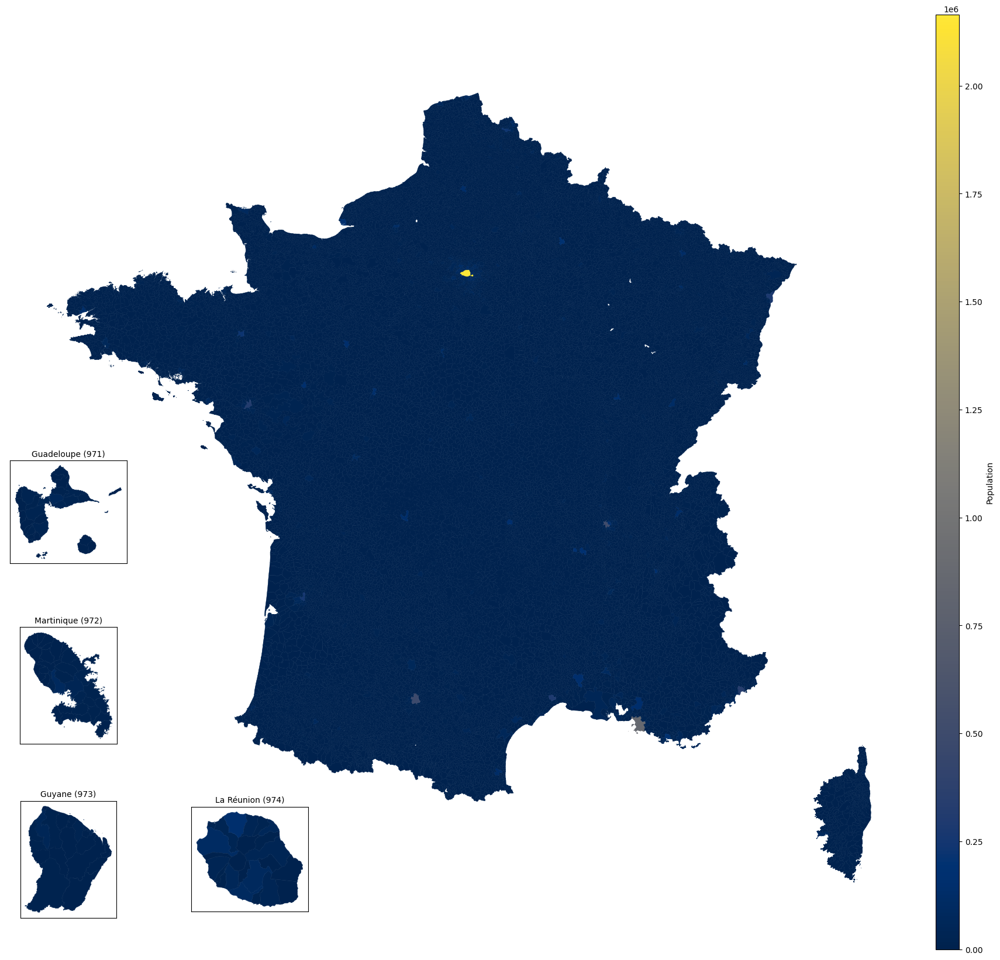

In [53]:

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(1, figsize=(20, 20))

# Calculate global min and max for consistent color scaling
vmin = plot_data["POPULATION"].min()
vmax = plot_data["POPULATION"].max()

# Plot mainland France
mainland_plot = plot_data[~plot_data["DEPARTEMENT"].isin(['971', '972', '973', '974'])].plot(
    column="POPULATION", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
)

# Capture the mappable object from the plot
mainland_mappable = mainland_plot.get_children()[0]

ax.axis("off")

inset_positions = [
    [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],  # [left, bottom, width, height, department, department name]
    [0, 0.2, 2, 2, '972', 'Martinique (972)'],
    [0, 0, 2, 2, '973', 'Guyane (973)'],
    [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
]

# Create the insets
for pos in inset_positions:
    ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                          bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                          bbox_transform=ax.transAxes)
    
    plot_data[plot_data["DEPARTEMENT"] == pos[4]].plot(
        column="POPULATION", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
    )
    
    ax_inset.axis("on")  # Turn on the axis to show the frame
    ax_inset.set_xticks([])  # Remove x-axis ticks
    ax_inset.set_yticks([])  # Remove y-axis ticks
    
    # Add department number on top of each inset plot
    ax_inset.set_title(pos[5], fontsize=10, pad=5)

# Add a colorbar
cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
plt.colorbar(mainland_mappable, cax=cax, label="Population")

# Adjust layout and display the plot
# plt.tight_layout()
plt.show()


# V3

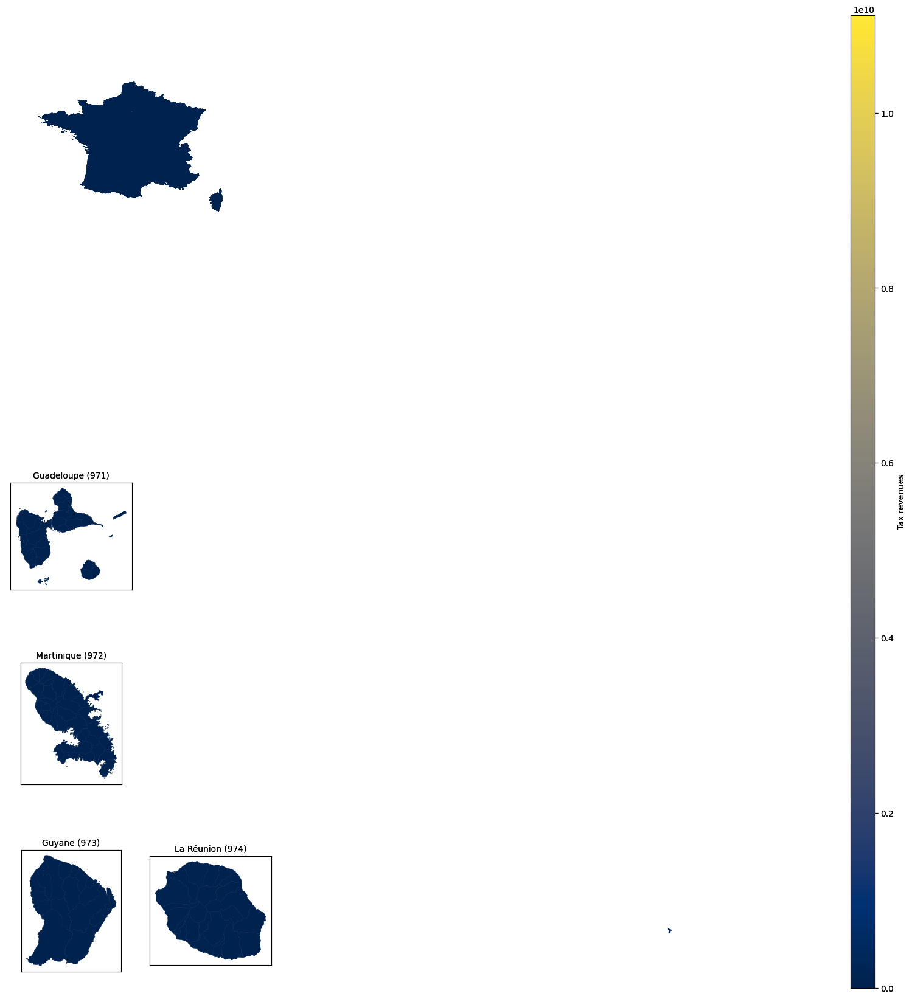

In [59]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(1, figsize=(20, 20))

# Calculate global min and max for consistent color scaling
vmin = plot_data["All taxes"].min()
vmax = plot_data["All taxes"].max()

for year in plot_data['ANNEE'].unique()[:2]:

    plot_data_year = plot_data[plot_data['ANNEE'] == year]
    
    # Plot mainland France
    mainland_plot = plot_data_year[~plot_data_year["DEPARTEMENT"].isin(['971', '972', '973', '974', '976', '977', '978'])].plot(
        column="All taxes", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
    )
    
    # Capture the mappable object from the plot
    mainland_mappable = mainland_plot.get_children()[0]
    
    ax.axis("off")
    
    inset_positions = [
        [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],  # [left, bottom, width, height, department, department name]
        [0, 0.2, 2, 2, '972', 'Martinique (972)'],
        [0, 0, 2, 2, '973', 'Guyane (973)'],
        [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    ]
    
    # Create the insets
    for pos in inset_positions:
        ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                              bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                              bbox_transform=ax.transAxes)
        
        plot_data_year[plot_data_year["DEPARTEMENT"] == pos[4]].plot(
            column="All taxes", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
        )
        
        ax_inset.axis("on")  # Turn on the axis to show the frame
        ax_inset.set_xticks([])  # Remove x-axis ticks
        ax_inset.set_yticks([])  # Remove y-axis ticks
        
        # Add department number on top of each inset plot
        ax_inset.set_title(pos[5], fontsize=10, pad=5)
    
    # Add a colorbar
    cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    plt.colorbar(mainland_mappable, cax=cax, label="Tax revenues")
    
    output_folder = "plots/map_plots"
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f"{year}_france_tax_revenue.png")
    plt.savefig(output_path, bbox_inches="tight", dpi=200)

# Adjust layout and display the plot
# plt.tight_layout()
# plt.show()


# V4

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# Calculate global min and max for consistent color scaling
vmin = plot_data["All taxes"].min()
vmax = plot_data["All taxes"].max()

for year in plot_data['ANNEE'].unique():

    fig, ax = plt.subplots(1, figsize=(20, 20))
    
    plot_data_year = plot_data[plot_data['ANNEE'] == year]
    
    # Plot mainland France
    mainland_plot = plot_data_year[~plot_data_year["DEPARTEMENT"].isin(['971', '972', '973', '974', '976', '977', '978'])].plot(
        column="All taxes", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
    )
    
    # Capture the mappable object from the plot
    mainland_mappable = mainland_plot.get_children()[0]
    
    ax.axis("off")
    
    inset_positions = [
        [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],  # [left, bottom, width, height, department, department name]
        [0, 0.2, 2, 2, '972', 'Martinique (972)'],
        [0, 0, 2, 2, '973', 'Guyane (973)'],
        [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    ]
    
    # Create the insets
    for pos in inset_positions:
        ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                              bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                              bbox_transform=ax.transAxes)
        
        plot_data_year[plot_data_year["DEPARTEMENT"] == pos[4]].plot(
            column="All taxes", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
        )
        
        ax_inset.axis("on")  # Turn on the axis to show the frame
        ax_inset.set_xticks([])  # Remove x-axis ticks
        ax_inset.set_yticks([])  # Remove y-axis ticks
        
        # Add department number on top of each inset plot with larger font
        ax_inset.set_title(pos[5], fontsize=14, pad=5)
    
    # Add a colorbar
    cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    cbar = plt.colorbar(mainland_mappable, cax=cax)
    cbar.ax.tick_params(labelsize=14)  # Increase colorbar tick label size
    
    # Add title to the map
    plt.suptitle(f"Tax revenues in {year}", fontsize=30, y=0.9)
    
    output_folder = "plots/map_plots/global_max_tax"
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f"{year}_france_tax_revenue.png")
    plt.savefig(output_path, bbox_inches="tight", dpi=200)
    plt.close(fig)
# Adjust layout and display the plot
# plt.tight_layout()
# plt.show()

In [113]:
plot_data['ANNEE'].unique()[18]

2004

In [124]:
plot_data[plot_data['DEPARTEMENT'].isin(['971', '972', '973', '974'])]['ANNEE'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012,
       2011, 2010, 2009, 2008, 2007, 2006, 2005, 2002, 2001, 2000, 1999,
       1998, 1997, 1996, 1995, 1994, 1993, 1992, 1991, 1990, 1989, 1988,
       1987, 1986, 1985, 1984, 1983, 1982], dtype=int64)

In [127]:
total_tax_data[total_tax_data['DEPARTEMENT'].isin(['971', '972', '973', '974'])]['ANNEE'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012,
       2011, 2010, 2009, 2008, 2007, 2006, 2005, 2002, 2001, 2000, 1999,
       1998, 1997, 1996, 1995, 1994, 1993, 1992, 1991, 1990, 1989, 1988,
       1987, 1986, 1985, 1984, 1983, 1982], dtype=int64)

In [119]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import FuncFormatter

# Calculate global min and max for consistent color scaling

for year in plot_data['ANNEE'].unique():
    fig, ax = plt.subplots(1, figsize=(20, 20))
    plot_data_year = plot_data[plot_data['ANNEE'] == year]
    vmin = plot_data_year["All taxes"].min()
    vmax = plot_data_year["All taxes"].max()
    
    # Plot mainland France
    mainland_plot = plot_data_year[~plot_data_year["DEPARTEMENT"].isin(['971', '972', '973', '974', '976', '977', '978'])].plot(
        column="All taxes", ax=ax, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
    )
    
    # Capture the mappable object from the plot
    mainland_mappable = mainland_plot.get_children()[0]
    
    ax.axis("off")
    
    inset_positions = [
        [0, 0.4, 2, 2, '971', 'Guadeloupe (971)'],  # [left, bottom, width, height, department, department name]
        [0, 0.2, 2, 2, '972', 'Martinique (972)'],
        [0, 0, 2, 2, '973', 'Guyane (973)'],
        [0.2, 0, 2, 2, '974', 'La Réunion (974)'],
    ]
    
    # Create the insets
    for pos in inset_positions:
        try:
            ax_inset = inset_axes(ax, width=pos[2], height=pos[3], loc='lower left',
                                  bbox_to_anchor=(pos[0], pos[1], pos[2], pos[3]),
                                  bbox_transform=ax.transAxes)
            
            plot_data_year[plot_data_year["DEPARTEMENT"] == pos[4]].plot(
                column="All taxes", ax=ax_inset, vmin=vmin, vmax=vmax, linewidth=.3, edgecolor='face', cmap='cividis'
            )
            
            ax_inset.axis("on")  # Turn on the axis to show the frame
            ax_inset.set_xticks([])  # Remove x-axis ticks
            ax_inset.set_yticks([])  # Remove y-axis ticks
            
            # Add department number on top of each inset plot with larger font
            ax_inset.set_title(pos[5], fontsize=14, pad=5)
        except: pass
    
    # Add a colorbar
    cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    cbar = plt.colorbar(mainland_mappable, cax=cax)
    cbar.ax.tick_params(labelsize=14)  # Increase colorbar tick label size
        
    # Format the colorbar ticks to show 2 decimal places
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(lambda x, p: f'{x:.1e}'))
    
    # Add title to the map
    plt.suptitle(f"Tax revenues in {year}", fontsize=30, y=0.9)
    
    output_folder = "plots/map_plots/local_max_tax"
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f"{year}_france_tax_revenue.png")cfe_tax_data
    plt.savefig(output_path, bbox_inches="tight", dpi=200)
    plt.close(fig)
# Adjust layout and display the plot
# plt.tight_layout()
# plt.show()

SyntaxError: expected 'except' or 'finally' block (1925261009.py, line 50)

# TP removal

In [122]:
cfe_tax_columns = ["POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL", # do not change first column, it will change the sum 9 cells lower
    "CFE - COMMUNE / TAUX VOTE",
    "CFE - LISSAGE / COMMUNE / MONTANT",
    "CFE - COMMUNE / BASE",
    "CFE - COMMUNE /TAUX NET",
    "CFE - COMMUNE / NOMBRE ARTICLES COMPORTANT UNE BASE TAXABLE DE CFE",
    "CFE - COMMUNE / PRODUIT REEL NET",
    "CFE - SOMME DES ALLOCATIONS COMPENSATRICES / COMMUNE",
    "DCRTP / Commune"]

In [123]:
query = f"""
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '\n', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    {", ".join(f'"{col}"' for col in cfe_tax_columns)},
    "ANNEE"
FROM francetax
"""
cfe_tax_data = client.query(query)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Query: 
SELECT
    REPLACE(REPLACE("Libellé commune", '-', ' '), '''', '') AS "Commune name",
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') THEN CONCAT('97', RIGHT(LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0'), 1))
        ELSE LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0')
    END AS DEPARTEMENT,
    CASE 
        WHEN LTRIM(REPLACE(DEPARTEMENT, '
', ''), '0') IN ('96', '98', '99') AND LENGTH(CAST(COMMUNE AS VARCHAR)) = 3 THEN RIGHT(CAST(COMMUNE AS VARCHAR), 2)
        WHEN COMMUNE = '999' THEN '56'
        ELSE REPLACE(CAST(COMMUNE AS VARCHAR), '''', '')
    END AS COMMUNE,
    "POPULATION TOTALE (MUNICIPALE ET COMPTEE A PART)  - Source saisies application FDL", "CFE - COMMUNE / TAUX VOTE", "CFE - LISSAGE / COMMUNE / MONTANT", "CFE - COMMUNE / BASE", "CFE - COMMUNE /TAUX NET", "CFE - COMMUNE / NOMBRE ARTICLES COMPORTANT UNE BASE TAXABLE DE CFE", "CFE - COMMUNE / PRODUIT REEL NET", "CFE - SOMME DES ALLOCATIONS COMPENSATRICES / COMMUNE", "DCRTP / Commune

In [124]:
cfe_tax_data['COMMUNE'] = cfe_tax_data['COMMUNE'].astype('str')

In [125]:
cfe_tax_data = pd.merge(cfe_tax_data, commune_code.loc[:,['DEPARTEMENT', 'COMMUNE', 'code INSEE']], how='inner', on=['DEPARTEMENT', 'COMMUNE'])
if cfe_tax_data['code INSEE'].isna().any():
    raise Exception('code INSEE has NULL values')

In [126]:
cfe_tax_data.fillna(0, inplace=True)

In [127]:
cfe_tax_data.replace(to_replace=['.', ','], value=0, inplace=True)

In [128]:
cfe_tax_data.drop_duplicates(inplace=True)
cfe_tax_data['Commune name'] = cfe_tax_data['Commune name'].apply(str.strip)
cfe_tax_data['Commune name'] = cfe_tax_data['Commune name'].str.replace(r'\bST\b', 'SAINT', regex=True)

In [129]:
cfe_tax_data = cfe_tax_data.replace(',', '.', regex=True)

In [130]:
cfe_tax_data[cfe_tax_columns] = cfe_tax_data[cfe_tax_columns].astype('float64')

In [ ]:
cfe_tax_data[]

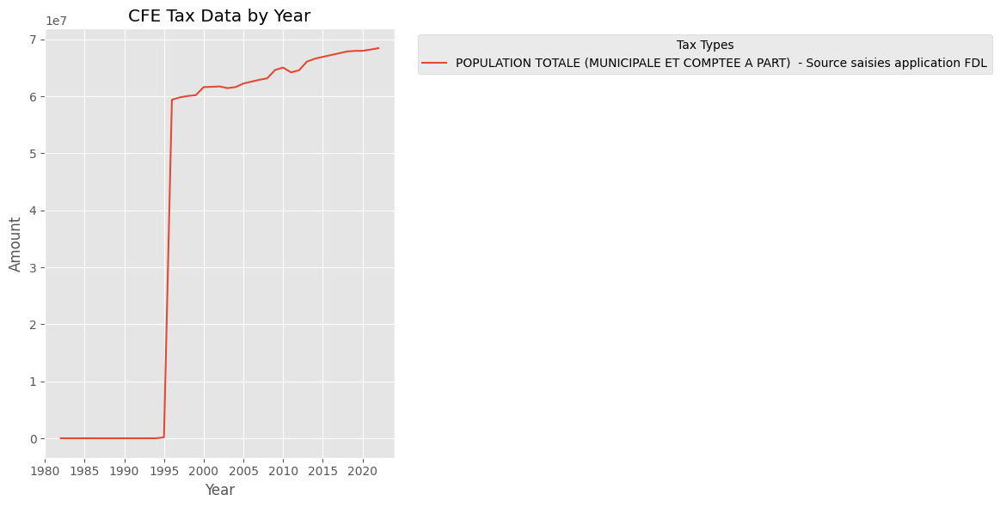

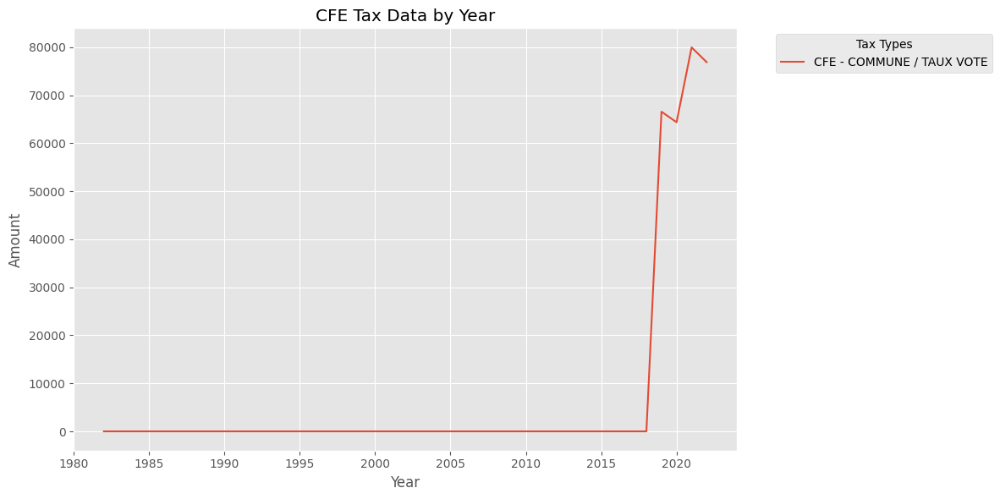

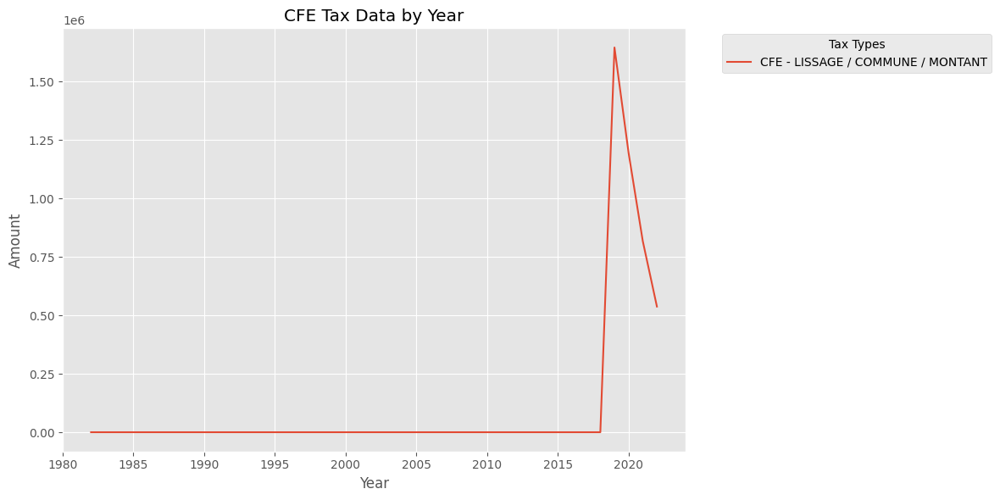

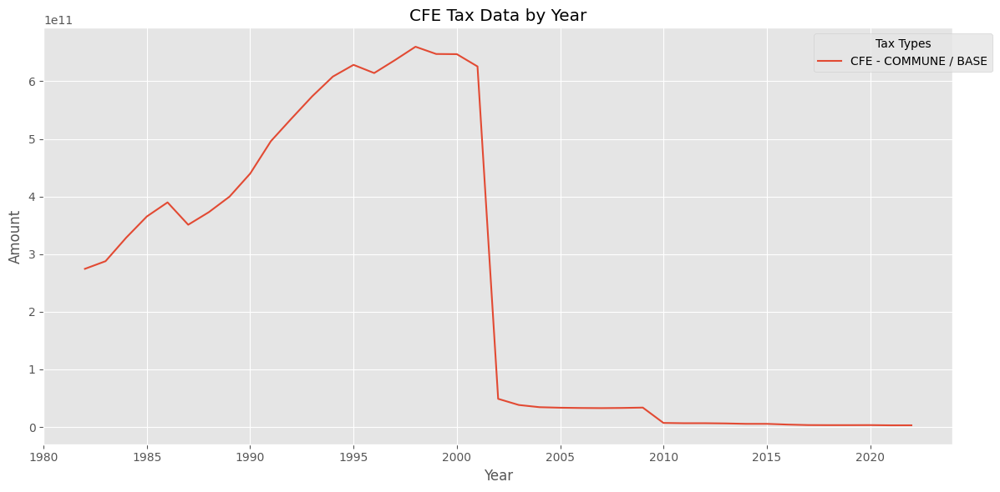

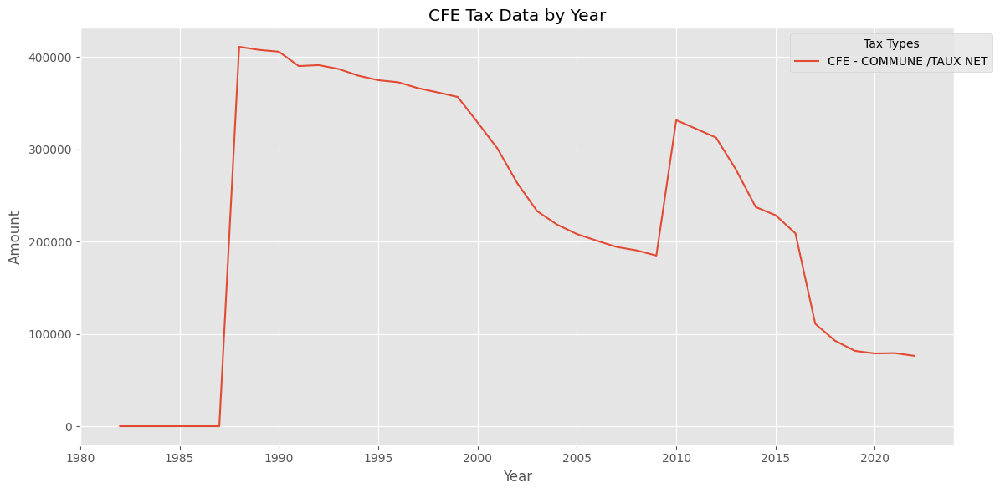

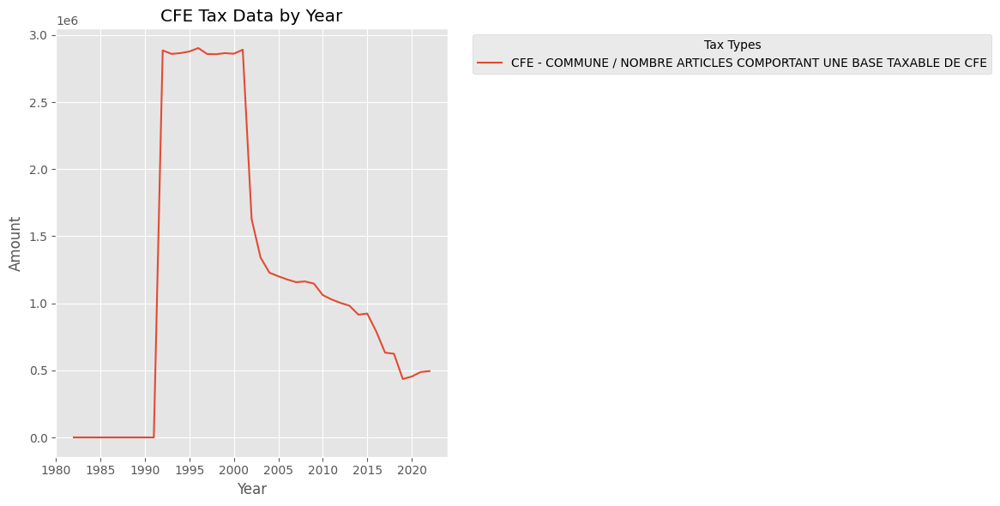

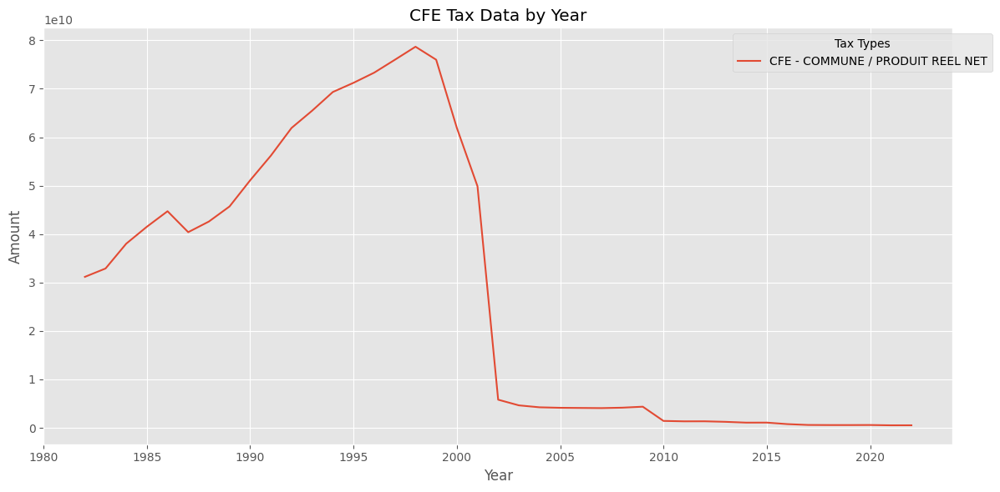

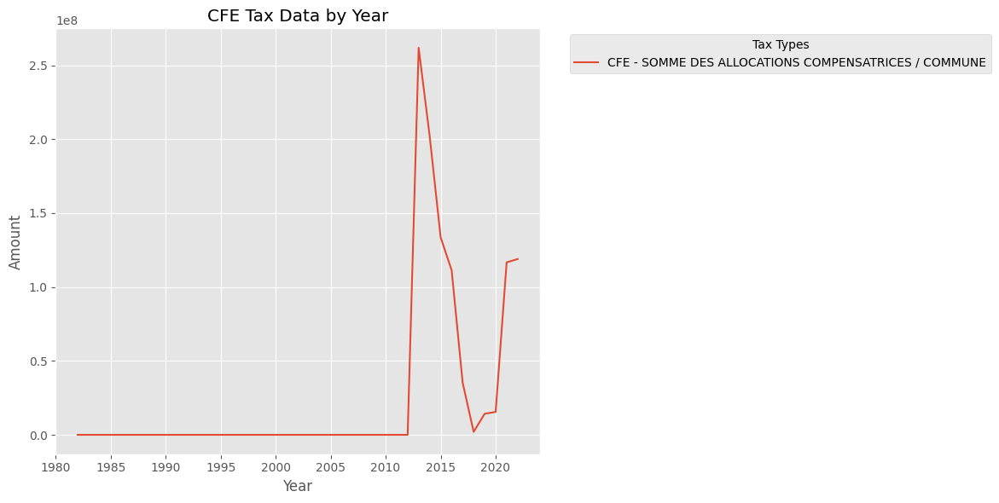

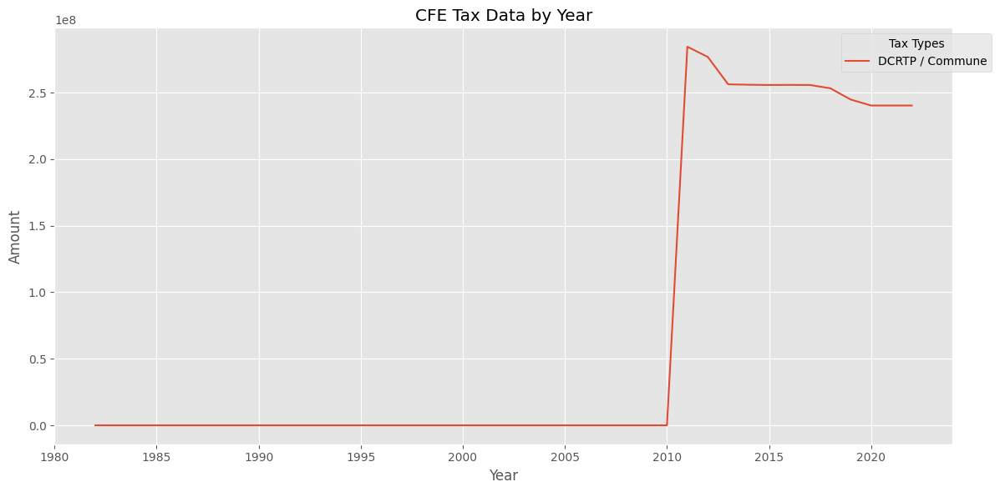

In [121]:
import matplotlib.pyplot as plt

# Assuming cfe_tax_columns is a list of column names you want to plot
for i in cfe_tax_columns:
    grouped_data = cfe_tax_data.groupby('ANNEE')[i].sum()
    
    # Create a figure and axis object
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Plot the data
    grouped_data.plot(ax=ax)
    
    # Customize the plot
    plt.title('CFE Tax Data by Year')
    plt.xlabel('Year')
    plt.ylabel('Amount')
    plt.legend(title='Tax Types', bbox_to_anchor=(1.05, 1), loc='best')
    plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
# Frank to Euro conversion for data before 2002
cfe_tax_data.loc[cfe_tax_data['ANNEE'] < 2002, cfe_tax_columns[1:]] = (cfe_tax_data[cfe_tax_data['ANNEE'] < 2002][cfe_tax_columns[1:]] / 6.55957).astype('int')

In [ ]:
cfe_tax_data['All taxes'] = cfe_tax_data[cfe_tax_columns[1:]].sum(axis=1) # it will change sum here

In [46]:
cfe_tax_data[cfe_tax_data['DCRTP / DEPARTEMENT'] != 0].groupby('DEPARTEMENT')['DCRTP / DEPARTEMENT'].sum()/cfe_tax_data[cfe_tax_data['DCRTP / DEPARTEMENT'] != 0].groupby('DEPARTEMENT')['DCRTP / DEPARTEMENT'].count()

DEPARTEMENT
1      1.156633e+07
10     6.023879e+06
11     1.246222e+07
12     8.151106e+06
13     4.503239e+07
14     9.526449e+06
15     4.656330e+06
16     1.206853e+07
17     9.337409e+06
18     6.533880e+06
19     7.144208e+06
2      9.383685e+06
21     4.249890e+06
22     1.847463e+07
23     3.677078e+06
24     9.449220e+06
25     1.665108e+07
26     1.721929e+07
27     7.069349e+06
28     7.730153e+06
29     2.089906e+07
2A     1.055653e+07
2B     6.294857e+06
3      1.321499e+07
30     2.162026e+07
31     2.911199e+07
32     7.094360e+06
33     2.575946e+07
34     2.495413e+07
35     2.553815e+07
36     4.301163e+06
37     5.452374e+06
38     4.336347e+07
39     8.140714e+06
4      4.268212e+06
40     1.215827e+07
41     5.898009e+06
42     2.349223e+07
43     7.479817e+06
44     2.234553e+07
45     1.357096e+06
46     4.699298e+06
47     8.601837e+06
48     1.065185e+06
49     6.283485e+06
5      3.139659e+06
50     1.407060e+07
51     4.960855e+04
52     4.469242e+06
53     7

In [48]:
x = pd.merge(cfe_tax_data[cfe_tax_data['DCRTP / DEPARTEMENT'] != 0].groupby('DEPARTEMENT')['DCRTP / Commune'].sum(), cfe_tax_data[cfe_tax_data['DCRTP / DEPARTEMENT'] != 0].groupby('DEPARTEMENT')['DCRTP / DEPARTEMENT'].sum()/cfe_tax_data[cfe_tax_data['DCRTP / DEPARTEMENT'] != 0].groupby('DEPARTEMENT')['DCRTP / DEPARTEMENT'].count(), on='DEPARTEMENT')

In [56]:
(x['DCRTP / Commune']/x['DCRTP / DEPARTEMENT']).mean()

8.05261744574102

In [75]:
x['DCRTP / DEPARTEMENT'].sum()

1380652495.6850376

In [76]:
x['DCRTP / Commune'].sum()

2839368764.0